# 1.Define Business Case / Problem Statements.

Bank GoodCredit wants to predict cred score for current credit card customers. The cred score will denote a customer’s credit worthiness and help the bank in reducing credit default risk.

Target variable → Bad_label
0 – Customer has Good credit history
1 – Customer has Bad credit history (falls into 30 DPD + bucket)

Our benchmark model has gini as 37.9.
Below is our rank ordering


#### PROJECT GOAL:

Build a model with the data provided

1.Data exploration insights – what did you find and what decision did you take?

2.Feature matrix - List of features selected with gain

3.Model evaluation - Gini and rank ordering

#### Data Explanation

1.Customer Account Data (Table : Cust_Account):
This table contains customer’s historical accounts data and payments history

2.Customer Enquiry Data (Table : Cust_Enquiry):
This table contains customer’s historical enquiry data such as enquiry amount and enquiry purpose.

3.Demographics Data (Table : Cust_Demographics):
Current customer applications with demographic data
Note that demographics features are renamed as features and obscured in accordance with privacy policies.

# 2.Import Basic Libraries

In [1]:
#!pip install mysql.connector

In [2]:
import numpy as np
import pandas as pd
from pandas import Series,DataFrame
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import xgboost

import sweetviz as sv

from scipy import stats
import os
import mysql.connector

# To avoid warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
from sklearn.preprocessing import RobustScaler
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,recall_score,f1_score,classification_report,accuracy_score,roc_auc_score
from sklearn.ensemble import BaggingClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier


# 3.Load Data

***MAKING CONNECTION TO SERVER***

In [4]:
# making connections to database server
connection = mysql.connector.connect(host ='18.136.157.135',
                                    port = 3306,
                                    user ='dm_team1',
                                    password ='DM!$Team&279@20!',
                                    database ='project_banking')

* The above code establishes a connection to a MySQL database server located at IP address '18.136.157.135' on port 3306. It uses the username 'dm_team1' and the corresponding password to access the 'project_banking' database.

In [5]:
connection

* "connection" refers to the variable or object named "connection" that we have created in our code. This variable is used to store and manage the connection to the MySQL database server. It holds all the information needed to communicate with the database, such as the server's address, port, username, and password. We can use this "connection" variable to perform various database operations, such as executing queries or retrieving data from the database.

In [6]:
# Check the number of databases available on the server

cursor=connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)


('information_schema',)
('project_banking',)


* cursor=connection.cursor(): This line creates a "cursor" object named "cursor" associated with our database connection. A cursor is like a pointer or control structure that allows us to execute SQL queries and fetch results from the database.

* cursor.execute('show databases'): This line executes an SQL query. Specifically, it runs the "SHOW DATABASES" query, which retrieves a list of all the databases available on the MySQL server we are connected to.

* for i in cursor:: This line starts a loop that iterates over the results of the query. In this case, it iterates over the list of databases retrieved by the "SHOW DATABASES" query.

* print(i): Within the loop, this line prints each database name (retrieved from the query results) to the console. So, it will display the names of all the databases available on the MySQL server.

* In summary, this code establishes a connection to a MySQL database, retrieves a list of all databases on the server, and then prints the names of those databases to the console, one at a time.

In [7]:
# Find the tables inside a database

database_tables=pd.read_sql_query('show tables',connection)
print(database_tables)

  Tables_in_project_banking
0              Cust_Account
1         Cust_Demographics
2              Cust_Enquiry


### In this data 3 tables are there.

* database_tables=pd.read_sql_query('show tables',connection): This line of code uses the pd.read_sql_query function from the Pandas library to execute an SQL query on the database using the existing database connection. The query being executed is 'show tables', which retrieves a list of all the tables in the currently selected database.

* print(database_tables): After executing the SQL query, the result (which will be a list of table names) is stored in the variable database_tables. This line then prints the content of database_tables to the console, which will display the list of table names from the database.

* So, in summary, this code connects to a MySQL database, retrieves a list of all the tables in the database, stores that list in the database_tables variable, and then prints the list of table names to the console using Pandas.

## FETCHING DATA FROM THE DATABASE 

### 1.Customer Account Data (Table : Cust_Account): 
    
This table contains customer’s historical accounts data and payments history

In [8]:
# To fetch all data from Cust_Account

query_1='select *from Cust_Account'
data_1=pd.read_sql(query_1,connection)
pd.set_option('display.max_columns',None)
print(data_1.shape)
data_1.head()

(186329, 21)


,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,0,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,10390,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,34420,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,0,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,13500,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,


* query_1='select from Cust_Account': This line defines an SQL query stored in the variable query_1. The query is set to retrieve all columns () from the table named Cust_Account.

* data_1=pd.read_sql(query_1,connection): This line uses the Pandas library's pd.read_sql function to execute the SQL query (query_1) on the connected MySQL database (connection). The result of the query is stored in the variable data_1 as a Pandas DataFrame.

* pd.set_option('display.max_columns',None): This line sets a Pandas option to display all columns of the DataFrame when it's printed, by setting the maximum number of columns to None.

* print(data_1.shape): This line prints the shape of the DataFrame data_1, which represents the number of rows and columns in the DataFrame.

* data_1.head(): This line displays the first few rows of the DataFrame data_1 using the head() method, giving you a preview of the data.

* In summary, this code performs the following actions:--

* Executes an SQL query to retrieve all columns from the Cust_Account table; Stores the query result in a Pandas DataFrame named data_1; Adjusts Pandas options to display all columns when printing; Prints the shape (rows and columns) of the DataFrame; Displays the first few rows of the DataFrame.

In [9]:
# Remove unwanted columns

customer_acc_columns = ['customer_no','high_credit_amt','cur_balance_amt','amt_past_due','cashlimit','creditlimit']
data_cust_acc = data_1.loc[:,customer_acc_columns]
data_cust_acc.head()

,customer_no,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit
0,12265,20900,0,,,
1,12265,16201,10390,,1400,14000
2,12265,41028,34420,,,
3,15606,93473,0,,,
4,15606,20250,13500,,,


* The above code extracts specific columns ('customer_no', 'high_credit_amt', 'cur_balance_amt', 'amt_past_due', 'cashlimit', 'creditlimit') from the original DataFrame (data_1) and stores them in a new DataFrame (data_cust_acc). Then, it displays the first few rows of this new DataFrame.

In [10]:
# To make groupby with customer_no

cust_acc_group = data_cust_acc.groupby(['customer_no'])
cust_acc_group.head()

,customer_no,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit
0,12265,20900,0,,,
1,12265,16201,10390,,1400,14000
2,12265,41028,34420,,,
3,15606,93473,0,,,
4,15606,20250,13500,,,
...,...,...,...,...,...,...
186317,1611,97741,0,,,
186318,1611,300000,287017,,,
186319,1611,34001,0,,,
186320,1611,42320,0,,,42490


* cust_acc_group = data_cust_acc.groupby(['customer_no']): This line of code groups the data in the data_cust_acc DataFrame by the 'customer_no' column. It creates a new object called cust_acc_group, which is a Pandas GroupBy object. This means that the data is organized into groups based on unique values in the 'customer_no' column.

* cust_acc_group.head(): This line displays the first few rows of each group within the cust_acc_group object. It shows a preview of the grouped data, where each group represents a unique customer identified by their 'customer_no'. The head() function is used to display only a few rows from each group.

* This can be useful for understanding the structure of the grouped data or for performing further analysis on each customer's account data.

In [11]:
acc_data = pd.DataFrame(cust_acc_group.sum()).reset_index()
acc_data.head()

,customer_no,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit
0,1,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,25288469363,168000,250000420000
1,10,1111113565675230005500000531458600000111851500...,068994000178725000000,,243000,405000
2,100,747754333541229800010000454945000034240350000,3970033460980316015530000,,980017700,300009800059000
3,1000,548289548289147688,31349029113,,6750081000,225000270000
4,10000,52590480000562501997410200520000,1752758222031250-26123003454770,,10000,60000


* cust_acc_group.sum(): This part calculates the sum of each numerical column within each group created by cust_acc_group. In other words, it sums up the values of each numerical column (e.g., 'high_credit_amt', 'cur_balance_amt', etc.) for each customer.

* .reset_index(): After performing the sum operation, this part resets the index of the resulting DataFrame. By resetting the index, the 'customer_no' column, which was previously the index, is converted back into a regular column, and the DataFrame gets a new default integer index.

* acc_data.head(): This line displays the first few rows of the acc_data DataFrame. The acc_data DataFrame now contains the sum of numerical values for each customer, and we're previewing the first few rows to see this aggregated data.

* In summary, this code takes the grouped data, calculates the sum of numerical columns for each customer, stores the result in a new DataFrame (acc_data), and then displays the first few rows of this aggregated data. This can be useful for analyzing the total financial activity for each customer.

In [12]:
# Convert into csv file

acc_data.to_csv('Cust_Account_data.csv',index=False)
print(acc_data.shape)

(23896, 6)


* acc_data.to_csv(...): This line is saving the acc_data DataFrame to a CSV file named 'Cust_Account_data.csv'. The to_csv function is a Pandas function used to export DataFrame data to a CSV file.

* index=False: This argument tells Pandas not to include the DataFrame's index column in the CSV file. When set to False, it means the CSV file will not have an additional column for row numbers

* The shape information helps you understand the size of the data you've exported to the CSV file

 ***********************************

### 2.Demographics Data (Table : Cust_Demographics): 

Current customer applications with demographic data,Note that demographics features are renamed as features and obscured in accordance with privacy policies.

In [13]:
# Featch all data from Cust_Demographics table

query_2 = 'select *from Cust_Demographics'
data_2=pd.read_sql(query_2,connection)
pd.set_option('display.max_columns',None)
data_2.head()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0


* The above code creates a copy of the 'Cust_Demographics' data in the demo_data DataFrame and then prints the shape (number of rows and columns) of this DataFrame, followed by a preview of the first few rows of data. This is useful for examining the structure and content of the 'Cust_Demographics' data.

In [14]:
demo_data = data_2
print(demo_data.shape)
demo_data.head()

(23896, 83)


,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0


* The above code creates a copy of the 'Cust_Demographics' data in the demo_data DataFrame and then prints the shape (number of rows and columns) of this DataFrame, followed by a preview of the first few rows of data. This is useful for examining the structure and content of the 'Cust_Demographics' data.

In [13]:
# To convert into csv file

demo_data.to_csv('Cust_Demographics_data.csv',index=False)

* The above code saves the data from the 'Cust_Demographics' table (stored in the demo_data DataFrame) to a CSV file called 'Cust_Demographics_data.csv'. The index column is excluded from the CSV file. This can be useful for storing the data in a format that can be easily shared or analyzed using other tools.

 ************************************************************

### 3.Customer Enquiry Data (Table : Cust_Enquiry): 

This table contains customer’s historical enquiry data such as enquiry amount and enquiry purpose.

In [15]:
# Fetch all data from Cust_Enquiry Table

query_3 = 'select *from Cust_Enquiry'
data_3 = pd.read_sql(query_3,connection)
pd.set_option('display.max_columns',None)
print(data_3.shape)
data_3.head()

(413188, 6)


,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2,3500000
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5,500000
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0,50000
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10,50000
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10,1000


#### The above code performs the following actions:-
    
Executes an SQL query to retrieve all columns from the 'Cust_Enquiry' table; Stores the query result in a Pandas DataFrame named data_3 ; Adjusts Pandas options to display all columns when printing ; Prints the shape (number of rows and columns) of the DataFrame ; Displays the first few rows of the DataFrame, providing a preview of the data in the 'Cust_Enquiry' table.

In [16]:
# To convert into csv file

data_3.to_csv('Cust_Enquiry',index=False)
data_3=pd.read_csv('Cust_Enquiry')
data_3.head()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2.0,3500000.0
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5.0,500000.0
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0.0,50000.0
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10.0,50000.0
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10.0,1000.0


* The above code initially saves the 'Cust_Enquiry' data to a CSV file, then reads it back into a DataFrame, and finally, it displays the first few rows of the data. This process can be useful for storing data persistently and then working with it in subsequent sessions or analyses.¶

In [17]:
data_cust_enquiry=data_3.loc[:,['customer_no','enq_amt']]
data_cust_enquiry.head()

,customer_no,enq_amt
0,1,3500000.0
1,1,500000.0
2,1,50000.0
3,1,50000.0
4,1,1000.0


* The above code extracts specific columns ('customer_no' and 'enq_amt') from the original DataFrame (data_3) and stores them in a new DataFrame (data_cust_enquiry). Then, it displays the first few rows of this new DataFrame, showing only the selected columns. This can be useful for focusing on and analyzing specific aspects of the data.

In [18]:
# To groupby with customer_no

Cust_enquiry_group = data_cust_enquiry.groupby(['customer_no'])
Cust_enquiry_group.head()

,customer_no,enq_amt
0,1,3500000.0
1,1,500000.0
2,1,50000.0
3,1,50000.0
4,1,1000.0
...,...,...
413172,23896,10000.0
413173,23896,1000.0
413174,23896,15000.0
413175,23896,1000.0


* The above code groups the data in data_cust_enquiry by 'customer_no', creating groups based on each unique customer, and then shows the first few rows of each group as a preview. This can be useful for understanding the structure of the grouped data or for performing further analysis on each customer's enquiry data.

In [19]:
enquiry_data_count = pd.DataFrame(Cust_enquiry_group.count()).reset_index()
enquiry_data_count.columns = ['customer_no','total_enq_count']
enquiry_data_count.head()

,customer_no,total_enq_count
0,1,18
1,2,68
2,3,1
3,4,34
4,5,2


* The above code creates a new DataFrame (enquiry_data_count) that summarizes the total number of enquiries for each customer by counting the rows in each group, renames the columns for clarity, and then displays the first few rows of this summary data. This can be useful for understanding the number of enquiries made by each customer.

In [20]:
enquiry_data_amt=pd.DataFrame(Cust_enquiry_group.sum()).reset_index()
enquiry_data_amt.columns = ['customer_no','total_enq_amt']
enquiry_data_amt.head(5)

,customer_no,total_enq_amt
0,1,4.981150e+06
1,2,6.676682e+09
2,3,3.400000e+06
3,4,5.081000e+07
4,5,2.000000e+03


* The above code creates a new DataFrame (enquiry_data_amt) that summarizes the total enquiry amount for each customer by summing the 'enq_amt' column within each group, renames the columns for clarity, and then displays the first seven rows of this summary data. This can be useful for understanding the total enquiry amounts made by each customer.

In [21]:
enquiry_data =pd.merge(enquiry_data_count,enquiry_data_amt,on='customer_no',how='inner')
enquiry_data.head()

,customer_no,total_enq_count,total_enq_amt
0,1,18,4.981150e+06
1,2,68,6.676682e+09
2,3,1,3.400000e+06
3,4,34,5.081000e+07
4,5,2,2.000000e+03


* pd.merge(...): This line uses the Pandas merge function to combine the data from two DataFrames, enquiry_data_count and enquiry_data_amt.

* on='customer_no': This specifies that the merge should be based on the 'customer_no' column, which is common to both DataFrames. It indicates that the 'customer_no' column will be used as the matching key.

* how='inner': This specifies the type of merge to perform. In this case, it's an 'inner' merge, which means that only the rows with matching 'customer_no' values in both DataFrames will be included in the result. Rows with non-matching 'customer_no' values will be excluded.

* The above code merges two DataFrames (enquiry_data_count and enquiry_data_amt) based on the 'customer_no' column, resulting in a new DataFrame (enquiry_data) that combines information about the total enquiry count and total enquiry amount for each customer.The merge is performed as an inner join, ensuring that only customers with matching 'customer_no' values in both DataFrames are included in the result.

In [22]:
enquiry_data.to_csv('Cust_enquiry_data.csv',index=False)

* The above code saves the data from the enquiry_data DataFrame, which contains information about customer enquiries, to a CSV file named 'Cust_enquiry_data.csv'. The index column is excluded from the CSV file. This can be useful for storing the data in a format that can be easily shared or analyzed using other tools.

In [23]:
# To show the dimention of all data tables

print(acc_data.shape)
print(demo_data.shape)
print(enquiry_data.shape)

(23896, 6)
(23896, 83)
(23896, 3)


* These lines are giving us information about the dimensions (number of rows and columns) of each of the three DataFrames: acc_data, demo_data, and enquiry_data. This is useful for understanding the size and structure of your data.

In [24]:
# To merge demo_data and acc_data due to customer_no column

data_merge=pd.merge(demo_data,acc_data,on='customer_no', how='inner')
print(data_merge.shape)
data_merge.head()

(23896, 88)


,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,25288469363,168000,250000420000
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0,1000000117595,674724007,,1,1000000
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0,121523,17864,,,
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0,4449180000050000011650007500003000000300000056...,0163749600000086886-2121189000000,,23600010500020000,394000262000300000
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0,1501591266293822042204,7973000000,,,


* The above code merges two DataFrames (demo_data and acc_data) based on the 'customer_no' column, resulting in a new DataFrame (data_merge) that combines information from both DataFrames. The merge is performed as an inner join, ensuring that only customers with matching 'customer_no' values in both DataFrames are included in the result. It then prints the shape of the merged DataFrame and displays the first few rows of the merged data.

In [25]:
# To concat data_merge and enquiry_data

data_final=pd.concat([data_merge,enquiry_data],axis=1)
print(data_final.shape)
data_final.head()

(23896, 91)


,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,customer_no,total_enq_count,total_enq_amt
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,25288469363,168000,250000420000,1,18,4.981150e+06
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0,1000000117595,674724007,,1,1000000,2,68,6.676682e+09
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0,121523,17864,,,,3,1,3.400000e+06
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0,4449180000050000011650007500003000000300000056...,0163749600000086886-2121189000000,,23600010500020000,394000262000300000,4,34,5.081000e+07
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0,1501591266293822042204,7973000000,,,,5,2,2.000000e+03


* pd.concat(...): This line uses the Pandas concat function to concatenate (combine) the two DataFrames, data_merge and enquiry_data, horizontally. It essentially joins the DataFrames side by side.

* [data_merge, enquiry_data]: This is a list containing the DataFrames to be concatenated. They are concatenated along the columns because axis=1 is specified.

* axis=1: This parameter specifies that the concatenation should be done along the columns (horizontally).

* The above code horizontally concatenates two DataFrames (data_merge and enquiry_data) into a new DataFrame (data_final), combining their columns. It then prints the shape of the combined DataFrame and displays the first few rows of the combined data. This is useful for merging data from different sources or for combining related data for analysis.

In [26]:
# To convert final data into csv file

data_final.to_csv('Bank_GoodCredit_data.csv')

* The code saves the combined data from the data_final DataFrame to a CSV file named 'Bank_GoodCredit_data.csv'. This can be useful for storing the merged data in a format that can be easily shared, analyzed, or used in other applications.

In [27]:
# To read the data

data=pd.read_csv('Bank_GoodCredit_data.csv')
data

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,2.528847e+10,168000,250000420000,1,18,4.981150e+06
1,1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0,1000000117595,674724007,NaN,1,1000000,2,68,6.676682e+09
2,2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0,121523,17864,NaN,NaN,NaN,3,1,3.400000e+06
3,3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0,4449180000050000011650007500003000000300000056...,0163749600000086886-2121189000000,NaN,23600010500020000,394000262000300000,4,34,5.081000e+07
4,4,06-May-15,5,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0,1501591266293822042204,7973000000,NaN,NaN,NaN,5,2,2.000000e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

# 4.Domain Analysis

# 5.Basic Checks

In [29]:
#To cheak total count of Columns and Rows

data.shape

(23896, 92)

* shape attribute is use for knowing the dimention of the dataset.

In [30]:
#To load first five columns

data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,2.528847e+10,168000,250000420000,1,18,4.981150e+06
1,1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0,1000000117595,674724007,NaN,1,1000000,2,68,6.676682e+09
2,2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0,121523,17864,NaN,NaN,NaN,3,1,3.400000e+06
3,3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0,4449180000050000011650007500003000000300000056...,0163749600000086886-2121189000000,NaN,23600010500020000,394000262000300000,4,34,5.081000e+07
4,4,06-May-15,5,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0,1501591266293822042204,7973000000,NaN,NaN,NaN,5,2,2.000000e+03


* head() function is used to know first five columns and row sample datasets

In [31]:
#To load random five columns

data.sample(5)

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
22786,22786,17-Dec-15,22787,05-Dec-15,Platinum Deligh,NaN,NaN,2.0,Card Setup,14.0,35000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS19,NaN,NaN,1.0,AYMPAXXXXX,22-Dec-91,92126XXXXX,N,@GMAIL.COM,2.0,0.0,NaN,New Delhi,110085.0,2012.0,1.0,Self,Y,1.0,1.0,Private Ltd. Co.,Others,TECHNICAL SUPPORT EXECUTIVE,2010.0,5.0,5.0,5.0,New Delhi,110085.0,@GMAIL.COM,PAN Card,AYMPAXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,10.0,Y,N,Y,N,NaN,Y,2012-1,10.0,157.0,110085.0,0.0,1.0,1.0,0-0,10.0,R,Y,NaN,0000-00-00,0.0,92126XXXXX,1.0,N,0,150412597,150412597,NaN,NaN,NaN,22787,3,61000.0
1054,1054,30-May-15,1055,11-May-15,Titanium Deligh,11-May-15,768.0,3.0,Card Setup,14.0,128000.0,NaN,NaN,NaN,Y,TD1,TD3,12.0,SA03,AS03,NaN,NaN,1.0,AICPCXXXXX,05-Jan-81,98910XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,Graduate,Noida / Greater Noida,201301.0,1995.0,0.0,Self,Y,1.0,1.0,Public Ltd Co.,Banking/Financial Services,DEALER,2008.0,7.0,11.0,0.0,New Delhi,110024.0,@JYOTIPORTFOLIO.COM,PAN Card,AICPCXXXXX,NaN,NaN,Y,HDFC Bank,78000.0,01-May-13,17-Jun-16,1.0,33.0,NaN,N,Y,N,NaN,Y,1995-0,33.0,71.0,201301.0,0.0,1.0,1.0,0-0,10.0,O,NaN,NaN,0000-00-00,0.0,98910XXXXX,1.0,N,0,110022912227,8338431727,NaN,30000,100000,1055,4,225000.0
4246,4246,03-Oct-15,4247,14-Sep-15,Titanium Deligh,15-Sep-15,690.0,1.0,Card Setup,14.0,58000.0,NaN,NaN,NaN,Y,TD1,NaN,0.0,112,H002,2827,NaN,1.0,APHPMXXXXX,20-Jul-88,99661XXXXX,N,@GMAIL.COM,2.0,0.0,Graduate,Hyderabad / Secunderabad,500097.0,2012.0,0.0,Rente,Y,1.0,33077.0,MNC,Banking/Financial Services,SENIOR RELATIONSHIP MANAGER,2015.0,3.0,7.0,0.0,Hyderabad,500082.0,@PNBMETLIFE.COM,PAN Card,APHPMXXXXX,Punjab National Bank,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,2.0,NaN,N,Y,N,NaN,Y,2012-0,2.0,14.0,500097.0,0.0,1.0,33077.0,0-0,2.0,R,NaN,NaN,0000-00-00,0.0,99661XXXXX,1.0,N,0,3360016350170004200011800019490319001367676036...,22398181417000792020059095135012494224727306350,NaN,2500,250002500030000,4247,28,1812401.0
16803,16803,07-Aug-15,16804,25-Jul-15,Platinum Deligh,25-Jul-15,812.0,3.0,Card Setup,14.0,30000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SARE,D054,NaN,NaN,1.0,AIWPGXXXXX,09-Jul-78,98113XXXXX,Y,@concentrix.com,1.0,2.0,Graduate,New Delhi,110085.0,2007.0,0.0,Self,Y,1.0,100000.0,Public Ltd Co.,Banking/Financial Services,MANAGER,2011.0,1.0,11.0,0.0,Gurgaon,122002.0,@CONCENTRIX.COM,Passport,H3069XXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,10.0,NaN,N,Y,N,NaN,Y,2007-0,10.0,157.0,110085.0,0.0,1.0,100000.0,0-0,13.0,R,NaN,NaN,0000-00-00,0.0,98113XXXXX,1.0,N,0,2000003200006300006300001000009001180002900001...,12203816448246222042830300003118700,NaN,76000,283500,16804,9,1935000.0
11091,11091,20-Oct-15,11092,29-Sep-15,Platinum Maxima,29-Sep-15,728.0,1.0,Card Setup,14.0,128000.0,NaN,NaN,NaN,N,PM1,NaN,NaN,SA05,MA01,NaN,NaN,1.0,BCNPKXXXXX,11-Nov-71,92788XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,New Delhi,110051.0,1993.0,0.0,Self,Y,2.0,35000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,110051.0,NaN,PAN Card,BCNPKXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,10.0,NaN,N,N,N,NaN,Y,1993-0,10.0,157.0,110051.0,0.0,2.0,35000.0,

* sample() function is used to knows sample of random rows and columns of the dataset.

In [32]:
#To load last five columns

data.tail()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
23891,23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704.0,1.0,Card Setup,14.0,119000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA05,MA01,NaN,NaN,1.0,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,New Delhi,110045.0,1988.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon,122001.0,NaN,PAN Card,CUQPSXXXXX,NaN,NaN,Y,State Bank of India,99000.0,01-Jan-15,17-Jun-16,1.0,10.0,Y,N,Y,N,NaN,Y,1988-10,10.0,157.0,110045.0,0.0,1.0,33000.0,0-0,13.0,R,Y,NaN,0000-00-00,0.0,XXXXX,1.0,N,0,1500004108218500088626132761834010000010000036...,14694311646162680648430009911300,NaN,1000029700,5000099000,23892,16,1570344.0
23892,23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,NaN,NaN,2.0,Card Setup,14.0,35000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS33,NaN,NaN,1.0,DTPPSXXXXX,01-Feb-87,99101XXXXX,N,@GMAIL.COM,2.0,0.0,Graduate,New Delhi,110037.0,2014.0,12.0,Rente,N,1.0,1.0,Private Ltd. Co.,Others,ENGINEER,2012.0,12.0,3.0,0.0,New Delhi,110037.0,@GMAIL.COM,PAN Card,DTPPSXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,10.0,N,N,Y,N,NaN,Y,2014-12,33.0,102.0,282001.0,1.0,1.0,1.0,0-0,10.0,O,Y,NaN,0000-00-00,0.0,99101XXXXX,1.0,N,0,27314,16393,NaN,NaN,NaN,23893,12,239010.0
23893,23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748.0,3.0,Card Setup,14.0,68000.0,NaN,NaN,NaN,Y,PM1,NaN,NaN,CD01,D066,NaN,NaN,1.0,CPOPSXXXXX,08-Nov-86,99111XXXXX,Y,@GMAIL.COM,2.0,0.0,Graduate,New Delhi,110033.0,1986.0,0.0,Paren,Y,1.0,1.0,Private Ltd. Co.,Health Care,SENIOR ANALYST,2015.0,1.0,3.0,0.0,Gurgaon,122016.0,@ACCRETIVEHEALTH.COM,PAN Card,CPOPSXXXXX,NaN,NaN,Y,HDFC Bank,52000.0,01-Sep-14,17-Jun-16,1.0,10.0,NaN,N,Y,N,NaN,Y,1986-0,10.0,157.0,110033.0,0.0,1.0,1.0,0-0,13.0,R,NaN,NaN,0000-00-00,0.0,99111XXXXX,1.0,N,0,149402050013401,207700,NaN,7000,14000,23894,4,102000.0
23894,23894,03-Nov-15,23895,30-Sep-15,Platinum Deligh,30-Sep-15,740.0,3.0,Card Setup,14.0,158000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA40,G011,NaN,NaN,1.0,AVZPGXXXXX,24-Nov-82,93100XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,New Delhi,110095.0,2010.0,0.0,Self,Y,2.0,25000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,110095.0,NaN,PAN Card,AVZPGXXXXX,NaN,NaN,Y,Citibank N.A.,65000.0,01-Apr-14,17-Jun-16,2.0,10.0,NaN,N,Y,N,NaN,Y,2010-0,10.0,157.0,110095.0,0.0,2.0,25000.0,03-May,10.0,R,NaN,NaN,0000-00-00,0.0,93100XXXXX,1.0,N,0,91873370504000006409211900034000,1707659253296561161764840,NaN,2970010000,9900065000,23895,8,727000.0
23895,23895,04-Dec-15,23896,06-Nov-15,Titanium Deligh,06-Nov-15,688.0,1.0,Card Setup,14.0,106000.0,NaN,NaN,NaN,Y,TD1,NaN,0.0,SA03,AS33,NaN,NaN,1.0,AJIPBXXXXX,15-Aug-83,97178XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,Ghaziabad,201005.0,2005.0,0.0,Paren,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Ghaziabad,201005.0,NaN,PAN Card,AJIPBXXXXX,NaN,NaN,Y,State Bank of India,106000.0,01-Feb-15,17-Jun-16,1.0,33.0,NaN,N,Y,N,NaN,Y,2005-0,33.0,41.0,201005.0,0.0,2.0,1.0,Aug-00,33.0,R,NaN,NaN,0000-00-00,0.0,97178XXXXX,1.0,N,0,1150000139572746743342,926142769-11-23338,4669.0,212004200,1060004

* tail() function is used to knows last five samples of rows and columns of the datasets

In [33]:
#To load all columns names

data.columns

Index(['Unnamed: 0', 'dt_opened', 'customer_no', 'entry_time', 'feature_1',
       'feature_2', 'feature_3', 'feature_4', 'feature_5', 'feature_6',
       'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11',
       'feature_12', 'feature_13', 'feature_14', 'feature_15', 'feature_16',
       'feature_17', 'feature_18', 'feature_19', 'feature_20', 'feature_21',
       'feature_22', 'feature_23', 'feature_24', 'feature_25', 'feature_26',
       'feature_27', 'feature_28', 'feature_29', 'feature_30', 'feature_31',
       'feature_32', 'feature_33', 'feature_34', 'feature_35', 'feature_36',
       'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_41',
       'feature_42', 'feature_43', 'feature_44', 'feature_45', 'feature_46',
       'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_51',
       'feature_52', 'feature_53', 'feature_54', 'feature_55', 'feature_56',
       'feature_57', 'feature_58', 'feature_59', 'feature_60', 'feature_61',
       '

* columns attribute is gives the all columns names is containing in the dataset.

In [34]:
#To know the datatypes of all columns

data.dtypes

Unnamed: 0           int64
dt_opened           object
customer_no          int64
entry_time          object
feature_1           object
                    ...   
cashlimit           object
creditlimit         object
customer_no.1        int64
total_enq_count      int64
total_enq_amt      float64
Length: 92, dtype: object

* dtypes attributes gives information about datatypes of all columns in the dataset.

In [35]:
#To know basic information about datasets

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 92 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       23896 non-null  int64  
 1   dt_opened        23896 non-null  object 
 2   customer_no      23896 non-null  int64  
 3   entry_time       23881 non-null  object 
 4   feature_1        23881 non-null  object 
 5   feature_2        21060 non-null  object 
 6   feature_3        21060 non-null  float64
 7   feature_4        23881 non-null  float64
 8   feature_5        23881 non-null  object 
 9   feature_6        23881 non-null  float64
 10  feature_7        23881 non-null  float64
 11  feature_8        1261 non-null   object 
 12  feature_9        1261 non-null   object 
 13  feature_10       51 non-null     object 
 14  feature_11       23881 non-null  object 
 15  feature_12       23881 non-null  object 
 16  feature_13       10892 non-null  object 
 17  feature_14  

* info() function gives the information about datatypes,null values and total memory usage of the dataset.

In [36]:
#To know the mathematical information of numerical columns

data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,23896.0,1.194750e+04,6.898325e+03,0.0,5.973750e+03,1.194750e+04,1.792125e+04,2.389500e+04
customer_no,23896.0,1.194850e+04,6.898325e+03,1.0,5.974750e+03,1.194850e+04,1.792225e+04,2.389600e+04
feature_3,21060.0,7.232359e+02,3.731868e+01,-1.0,6.980000e+02,7.210000e+02,7.450000e+02,8.960000e+02
feature_4,23881.0,2.321595e+00,8.928375e-01,1.0,1.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00
feature_6,23881.0,1.400000e+01,0.000000e+00,14.0,1.400000e+01,1.400000e+01,1.400000e+01,1.400000e+01
feature_7,23881.0,1.190705e+05,7.752349e+04,0.0,7.200000e+04,1.040000e+05,1.390000e+05,1.217000e+06
feature_14,16163.0,8.086618e+00,5.625654e+00,0.0,0.000000e+00,1.200000e+01,1.200000e+01,1.200000e+01
feature_19,23881.0,1.049412e+00,2.167305e-01,1.0,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00
feature_25,23881.0,1.233910e+00,4.233244e-01,1.0,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00
feature_26,23881.0,7.256396e-01,1.124986e+00,0.0,0.000000e+00,0.000000e+00,2.000000e+00,1.000000e+01


* describe() function is gives mathematical and statistical information about numerical dataset and .T is gives transpose of the dataset.

In [37]:
#To know mathematical information of a categorical data

data.describe(include="object").T

,count,unique,top,freq
dt_opened,23896,197,16-Nov-15,699
entry_time,23881,296,19-Oct-15,180
feature_1,23881,7,Platinum Maxima,9056
feature_2,21060,281,19-Oct-15,182
feature_5,23881,1,Card Setup,23881
feature_8,1261,19,ROTVR,336
feature_9,1261,19,Negative Office Tele Verification,336
feature_10,51,9,3.09E+11,35
feature_11,23881,2,Y,22611
feature_12,23881,16,PM1,8853


* describe(include="object")--> here include = 'object' is use to get the mathematical and statistical information about categorical columns of the dataset.

In [38]:
#Percentage of null value present in the dataset

data.isnull().sum()

Unnamed: 0            0
dt_opened             0
customer_no           0
entry_time           15
feature_1            15
                   ... 
cashlimit          5461
creditlimit        4024
customer_no.1         0
total_enq_count       0
total_enq_amt         0
Length: 92, dtype: int64

* isnull() fuction is used to check null values in the dataset and sum() funtion is used to get the sum of null values in numerical format.

In [39]:
#To cheak duplicated values in the dataset

data.duplicated().sum()

0

* duplicated() function is used to check any duplicted rows in the dataset.
* In this dataset is not containing any duplicated values.

In [40]:
# Featch numerical columns

num_col=data.select_dtypes(include=['int64','float64'])
num_col.columns

Index(['Unnamed: 0', 'customer_no', 'feature_3', 'feature_4', 'feature_6',
       'feature_7', 'feature_14', 'feature_19', 'feature_25', 'feature_26',
       'feature_29', 'feature_30', 'feature_31', 'feature_34', 'feature_35',
       'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_44',
       'feature_49', 'feature_52', 'feature_55', 'feature_56', 'feature_64',
       'feature_65', 'feature_66', 'feature_67', 'feature_68', 'feature_69',
       'feature_71', 'feature_74', 'feature_76', 'feature_78', 'Bad_label',
       'amt_past_due', 'customer_no.1', 'total_enq_count', 'total_enq_amt'],
      dtype='object')

* select_dtypes(include=['int64','float64']) is used to fetch only numerical columns names in the dataset.

In [41]:
# Featch categorical columns

cat_col=data.select_dtypes(include=['object'])
cat_col.columns

Index(['dt_opened', 'entry_time', 'feature_1', 'feature_2', 'feature_5',
       'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12',
       'feature_13', 'feature_15', 'feature_16', 'feature_17', 'feature_18',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_27', 'feature_28', 'feature_32', 'feature_33', 'feature_36',
       'feature_37', 'feature_38', 'feature_43', 'feature_45', 'feature_46',
       'feature_47', 'feature_48', 'feature_50', 'feature_51', 'feature_53',
       'feature_54', 'feature_57', 'feature_58', 'feature_59', 'feature_60',
       'feature_61', 'feature_62', 'feature_63', 'feature_70', 'feature_72',
       'feature_73', 'feature_75', 'feature_77', 'feature_79',
       'high_credit_amt', 'cur_balance_amt', 'cashlimit', 'creditlimit'],
      dtype='object')

* select_dtypes(include=['object']) is used to fetch all categorical columns names in the dataset

* In the above code we receive a table of statistical summary information for the categorical columns in the DataFrame. This summary typically includes the count (number of non-null values), unique (number of unique categories), top (most frequently occurring category), and freq (frequency of the top category). It helps us to understand the distribution of categorical data in the DataFrame.

**In this data one constant column is available(feature_6)**

In [42]:
data.drop('feature_6', inplace=True, axis=1)

* .drop(...): This method is used to remove a specified column or row from the DataFrame.

* 'feature_6': This is the name of the column to be dropped. In this case, 'feature_6' is the column that will be removed from the DataFrame.

* inplace=True: This parameter specifies that the operation should be performed directly on the DataFrame data, and the DataFrame should be modified in place without the need to create a new DataFrame.

* axis=1: This parameter indicates that we want to drop a column (axis=1) as opposed to a row (axis=0).

* After executing this code, the 'feature_6' column will be removed from the data DataFrame, and the DataFrame will be modified accordingly, with 'feature_6' no longer present as a column.

In [43]:
# find unique categories in dataset

for i in cat_col:
    print(i,data[i].unique())
    print(data[i].value_counts())
    print('******************')

dt_opened ['18-Apr-15' '21-Apr-15' '22-Apr-15' '25-Apr-15' '06-May-15' '12-May-15'
 '22-May-15' '28-May-15' '30-May-15' '01-Jun-15' '04-Jun-15' '05-Jun-15'
 '19-Jun-15' '30-Jun-15' '02-Jul-15' '06-Jul-15' '22-Jul-15' '27-Jul-15'
 '29-Jul-15' '31-Jul-15' '05-Aug-15' '07-Aug-15' '11-Aug-15' '17-Jul-15'
 '22-Aug-15' '26-Aug-15' '28-Aug-15' '29-Aug-15' '09-Sep-15' '10-Sep-15'
 '14-Sep-15' '15-Sep-15' '19-Sep-15' '24-Sep-15' '05-Oct-15' '06-Oct-15'
 '09-Oct-15' '29-Oct-15' '30-Oct-15' '04-Nov-15' '05-Nov-15' '15-Jul-15'
 '27-Nov-15' '15-Dec-15' '17-Dec-15' '30-Dec-15' '17-Nov-15' '20-Oct-15'
 '21-Oct-15' '26-Oct-15' '28-Oct-15' '03-Nov-15' '10-Nov-15' '12-Nov-15'
 '21-Nov-15' '26-Nov-15' '30-Nov-15' '01-Dec-15' '21-Dec-15' '22-Dec-15'
 '24-Dec-15' '09-Dec-15' '16-Apr-15' '23-Apr-15' '24-Apr-15' '27-Apr-15'
 '28-Apr-15' '29-Apr-15' '30-Apr-15' '01-May-15' '02-May-15' '05-May-15'
 '07-May-15' '08-May-15' '11-May-15' '13-May-15' '14-May-15' '15-May-15'
 '16-May-15' '18-May-15' '19-May-15' '20-

* Above code is used to get repeated names or unique names of categorical columns.

# 6.Exploratory Data Analysis

***i).Univariate Analysis***

In [78]:
# Drop irrelavent columns

feat = data.drop(['Unnamed: 0','dt_opened','customer_no','entry_time','feature_2','feature_10','feature_20','feature_21','feature_22','feature_24','feature_45','feature_47','feature_53','feature_54','feature_77','Bad_label','feature_18','feature_61','customer_no.1'], axis=1)
feat.sample(7)

,feature_1,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_19,feature_23,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_48,feature_49,feature_50,feature_51,feature_52,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_78,feature_79,high_credit_amt,cur_balance_amt,amt_past_due,cashlimit,creditlimit,total_enq_count,total_enq_amt
7351,Platinum Maxima,738.0,3.0,Card Setup,14.0,101000.0,NaN,NaN,Y,PM1,NaN,NaN,HA07,SI03,NaN,1.0,N,2.0,1.0,Post-Graduate,Hyderabad / Secunderabad,500062.0,2008.0,0.0,Self,Y,1.0,66920.0,Private Ltd. Co.,Information Technology,CONSULTANT,2013.0,10.0,7.0,0.0,Hyderabad,500081.0,PAN Card,HDFC Bank,NaN,N,NaN,0.0,1.0,2.0,NaN,N,Y,N,Y,2008-0,2.0,14.0,500062.0,0.0,1.0,66920.0,0-0,2.0,R,NaN,NaN,0000-00-00,0.0,1.0,N,2400000309912461051000113737750000270000165200...,2388267516155324782103679610505016364040001633...,NaN,120001300081006000,3000065000810005000015000,70,16333191.0
16864,Platinum Deligh,707.0,3.0,Card Setup,14.0,121000.0,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS16,NaN,1.0,N,1.0,2.0,Graduate,New Delhi,110092.0,1999.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,110092.0,Voter ID,NaN,NaN,Y,HDFC Bank,100000.0,1.0,10.0,NaN,N,Y,N,Y,1999-0,10.0,157.0,110092.0,0.0,2.0,1.0,Nov-00,10.0,R,NaN,NaN,0000-00-00,0.0,1.0,N,2650063500300008400012420715000015000010000040...,002733840005590000000000,NaN,25200,84000,26,3208400.0
20022,Platinum Maxima,744.0,3.0,Card Setup,14.0,390000.0,NaN,NaN,Y,PM1,NaN,NaN,SA07,G011,NaN,1.0,N,1.0,0.0,Graduate,New Delhi,110045.0,1980.0,0.0,Self,Y,1.0,44000.0,Public Ltd Co.,Banking/Financial Services,CONSULTANT,2008.0,1.0,0.0,0.0,New Delhi,110008.0,PAN Card,NaN,NaN,Y,HDFC Bank,300000.0,1.0,10.0,NaN,N,Y,N,Y,1980-0,10.0,157.0,110045.0,0.0,1.0,44000.0,0-0,10.0,R,NaN,NaN,0000-00-00,0.0,1.0,N,2750091263049230492121203370002113515336,8250-1002381046110,NaN,100013000,1000021000,14,609800.0
22359,Platinum Deligh,NaN,2.0,Card Setup,14.0,69000.0,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS19,NaN,1.0,N,1.0,0.0,Post-Graduate,New Delhi,110084.0,2005.0,0.0,Paren,Y,1.0,1.0,Private Ltd. Co.,Banking/Financial Services,SYSTEM EXECUTIVE,2011.0,1.0,10.0,0.0,New Delhi,110001.0,PAN Card,NaN,NaN,Y,NaN,62000.0,1.0,10.0,NaN,N,Y,N,Y,2005-0,10.0,157.0,110084.0,0.0,1.0,1.0,0-0,10.0,R,NaN,NaN,0000-00-00,0.0,1.0,N,2884576936444460252158419500181094000023000,2884-9364442640500-600,NaN,62005000,6200050000,15,529501.0
20701,Platinum Deligh,721.0,3.0,Card Setup,14.0,460000.0,NaN,NaN,Y,PD1,NaN,0.0,W01,SRC1,NaN,1.0,Y,1.0,0.0,Graduate,New Delhi,110075.0,2011.0,0.0,Rente,Y,1.0,1.0,MNC,Banking/Financial Services,TEAM LEAD,2007.0,8.0,8.0,0.0,Gurgaon,122001.0,PAN Card,NaN,NaN,Y,HDFC Bank,383000.0,1.0,10.0,NaN,N,Y,N,Y,2011-0,10.0,157.0,110075.0,0.0,1.0,1.0,0-0,13.0,R,NaN,NaN,0000-00-00,0.0,2.0,N,4300015801304192757110130061512204546322172200...,30712029990016320-20694190322180-1100-100,NaN,3440022001695016800,172000220001695006900013000420002200022000,25,101489899.0
23870,Platinum Maxima,751.0,3.0,Card Setup,14.0,130000.0,NaN,NaN,Y,PM1,NaN,NaN,CH08,RSN1,5736,1.0,N,2.0,3.0,Graduate,Tiruvallur,600062.0,2014.0,0.0,Rente,Y,2.0,45000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Tiruvallur,600062.0,PAN Card,NaN,NaN,Y,State Bank of India,100000.0,1.0,31.0,NaN,N,Y,N,Y,2014-0,31.0,835.0,600062.0,0.0,2.0,45000.0,07-May,31.0,R,NaN,NaN,0000-00-00,0.0,1.0,N,1364400004100010092999369993691500012000120001...,0001009307816000000612,NaN,2000020000,100000100000,3,101000.0
22189,Platinum Deligh,736.0,1.0,Card Setup,14.0,116000.0,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS32,NaN,1.0,N,1.0,0.0,Graduate,New Delhi,110094

In [76]:
#Sweetviz Report for univariate data analysis
my_report = sv.analyze(feat)

my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## Insight:-
    
    
    
* Due to feature_1 maximum customers are belong to Platinum Maxima group after that Platinum Deligh group and then Titanium Deligh group and minimum customer are belong to RBL Bank Fun and other.

* Due to feature_3 above 40% customers are in the range of 700 and 800.

* Due to feature_4 above 60% customers are in the 3.0 category and above 20% customers in 1.0 less than 20% customers are 2.0 category.

* Due to feature_5 near to 100% people has Card Setup.

* Due to feature_7  60% customers has 0.1M near to 40% customers has 0.2M.

* Due to feature_8 more than 25% customers are belong in ROTVR and more than 20% customers are in RCFO and near to 20% customers are RMTVR and near to 15% customers are RFCR and near to 20% customers are other.

* Due to feature_9 Negative Office Tele Verification customers are more than 25% and Contactability Failure at Office customers are more than 20% and Negative Mobile Tele Verification customers are near to 20% and Contactability Failure at Residence customers are more than 10% and others are near to 20%.

* Due to feature_11 more than 80% customers are yes category and less than 10% customers are No category.

* Due to feature_12 above 30% customers are in PM1 and PD1 and more than 20% are in TD1 and 1% are in PB1 and 2% are in other.

* According to feature_13  near to 80% customers are PD3 and more than 20% customers are in TD3.

* Due to feature_14 more than 68% customers are in 12.0 and 32% customers are in 0.0.

* Due to feature_15 maximum customers are belongs to SA03 and other.

* Due to feature_16 maximum customers are belongs in other.

* Due to feature_17 maximum customers are belongs in other.

* Due to feature_19 more than 80% customer in 1.0 and in 2.0 customers are 2%.

* Due to feature_23 more than 80% customer in No side and 10% customers are in yes side.

* Due to feature_25 near to 80% customers are in 1.0 and more than 20% customers are in 2.0.

* Due to feature_26 above 60% customers are in 1.0 after than reduced the percentage.

* Due to feature_27 72% customers are Graduate and 23% customers are Post Graduate and very few customers are MBA/MMS, Diploma and Others.

* Due to feature_28 more than 50% customers are from New Delhi and near to 10% customers are from Hyderabad, Secunderabad, Mumbai, Navi Mumbai, Thane, Ghaziabad and near to 30% customers are from other.

* Due to feature_29 maximum customers are 712k and minimum customers are 110k and average of the customers are 218k.

* Due to feature_30 maximum customers are in 2015.0 and minimum customers are in 1964.0
 and average of the customers are in 2001.2 

* According to feature_30 the values are increase the percentage of the customers are also increases.

* Due to feature_31 maximum customers are in 12.0 and minimum customers are in 0.0 and average of the customers are in 0.7.

*  Due to feature_32 more than 40% customers has self accommodation and near to 30% customers are live in rent and parents house and remaining are are lives companion / PG / Hostel.

*  Due to feature_33 82% customers are in yes side and 18% customers are in No side.

*  Due to feature_34 76% customers are in 1.0, 24% customers are in 2.0 and 1% customers are in 3.0.

*  Due to feature_35 near to 100% customers are in range 0.0M to 2.0M .

*  Due to feature_36 48% customers are work in Private Ltd. Co., 31% customers are work in Public Ltd. Co., 9% are work in Proprietorship, 8%  are work in MNC, 4% are work in Government Organisation and 1%  are work in Partnership Co., PSU, Partnership and Others.

* Due to feature_37 more than 72% customers are from Banking/Financial Services, 4% Customers are from Information Technology, 1% Customers are from Industrial, KPO/LPO/ITES, Health Care and less than 1% customers are from Manufacturing, Transportation/Logistics, Real Estate, Tourism, Agriculture and 19% customers are belongs to others profession.

* Due to feature_38 designation of the customers are 9% are Manager, 4% Asst.Manager and Executive, 3% are Sr.Executive,2% are Accountant, 1% are Team Leader and Sr.Manager and 75% are in others designation.

* Due to feature_39 maximum customers are 2,015 and minimum customers are 0 and average is 1,533.

* Due to feature_40 more than 40% customers are in lower range and very less customers in higher range.

* Due to feature_41 maximum customers value is 11.0 and minimum customers values is 0.0

* Due to feature_42 maximum customers value is 11.0 and minimum customers values is 0.0

* Due to feature_43 41% customers are from New Delhi, 15% are from Gurugram, 11% are from Noida, 9% are from Hyderabad, 6% are from Mumbai, 3% are from Faridabad, 2% are from Bangalore, Ghaziabad, Ahmedabad, Vadodara, other  1% are from Thane, Pune and less than 1% are from Chennai, Rangareddy, Navi Mumbai, Kolhapur, Kanchipuram. 

* Due to feature_44 maximum value is 712k and minimum value is 0k.

* Due to feature_46  near to 100% customers are PAN Card holder and very few customers has Passport, Driving Licence, Aadhar Card and Voter ID as a ID proof document.

* Due to feature_48 more than 20% customers are from HDFC Bank and ICICI Bank near to 10% customers are from Axis Bank and The Ratnakar Bank Ltd. and more than 30% customers are belongs to others bank.

* Due to feature_49 maximum value is 809.0B and minimum value is 0.0B.

* Due to feature_50 more than 50% customers are in yes side and near about 50% customers are in no side.

* Due to feature_51 more than 46% customers are from HDFC bank, more than 21% customers are from State Bank of India more than 12% customers are from Citibank N.A. and other bank and less than 8% customers are from AXIS Bank,5% customers are from ICICI Bank, 1% customers are from Kotak Mahindra Bank Ltd and IndusInd Bank Ltd and less than 1% are from HSBC Bank and American Express Banking Corporation.

* Due to feature_52 maximum value is 3.8M and minimum value is 0.0M

* Due to feature_55 more than 80% of customers are in 1.0 and few customers are in 2.0, 3.0 and 4.0.

* Due to feature_56 maximum value is 35.0 and minimum value is 2.0.

* Due to feature_57 more than 80% customers are in yes side and very few customers are in no side.

* Due to feature_58 near to 100% customers are in No side and very few customers are in Yes side.

* Due to feature_59 more than 80% customers are in yes side and near to 10% customers are in No side.

* Due to feature_60 near to 100% customers are in No side and very few customers are in Yes side.

*  Due to feature_62 near to 100% customers are in yes side and very few customers are in No side.

* Due to feature_63 58% customer are in other year

* Due to feature_64 maximum value is 35.0 and minimum value is 2.0 and average is 14.6 .

*  Due to feature_65 maximum value is 10,008 and minimum value is 1 and average is 158 

* Due to feature_66 maximum value is 874k and minimum value is 110k and average is 264k

* Due to feature_67 80% customers are in 0.0 and 20% customers are in 1.0

*  Due to feature_68 near to 80% customers are in 1.0 and more 20% customers are in 2.0 and no one in 3.0

* Due to feature_69 maximum value is 15.0M and minimum value is 0.0M and average is also 0.0M

* Due to feature_70 76% customers has no month record 8% customers are in November month 2% customers are in Oct month 1% customers are in May and Aug Month less than 1% customers are in Jun and Mar month and 10% customers are in other month.

* Due to feature_71 maximum value is 35.0 and minimum value is 2.0 and average value is  14.5

* Due to feature_72 65% customers are in 'R' and 35% customers are in 'O'.

* Due to feature_73 72% customers are in Yes and 28% customers are in No.

* Due to feature_74 65% are in 2.0, 29% are in 3.0 and 6% are in 4.0.

* Due to feature_76 here 100% of customers has not exact date found.

* Due to feature_78 96% are in 1.0 and 3% are in 2.0 and less than 1% are in 3.0

* Due to feature_79 here 99% customers are in No side and less than 1% customers are in Yes side.

* Here near to 99% customers are found in other heigh credit amt due to expected credit amt.

* Here near to 99% customers are found in other current balance amt due to expected current balance amt.

* The maximum past amount due is 443.0T

* 92% customers has in other cash limit due to expected cash limit.

* 93% customers has in other credit limit due to expected credit limit.

* The maximum number of total enquiry count is 308 and minimum is 0.

* The maximum number of total enquiry amt is 7.1B and minimum is 0.0B





    

***ii).Bivariate Analysis***

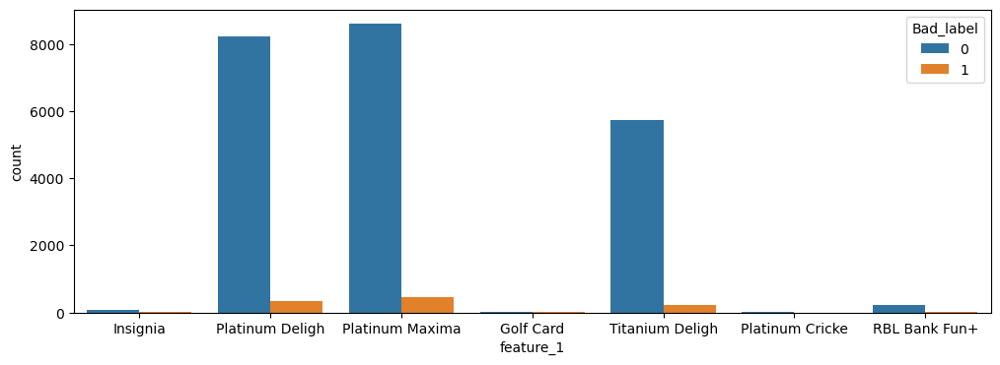

In [32]:
# Analyse the relationship feature_1

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_1',hue='Bad_label')
plt.show()

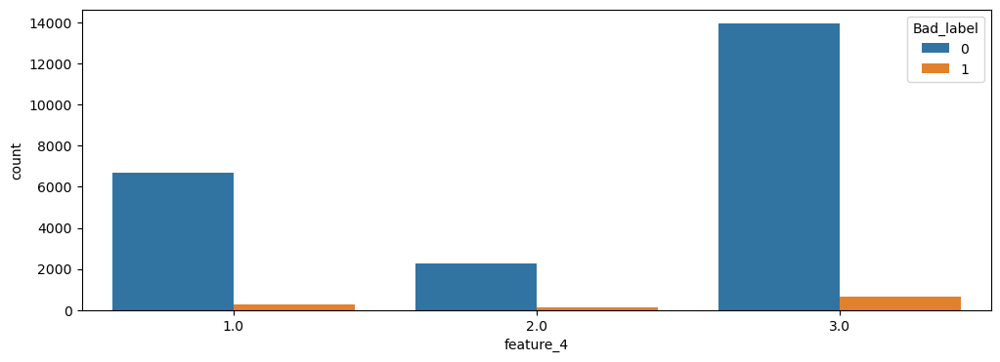

In [33]:
# feature_4

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_4',hue='Bad_label')
plt.show()

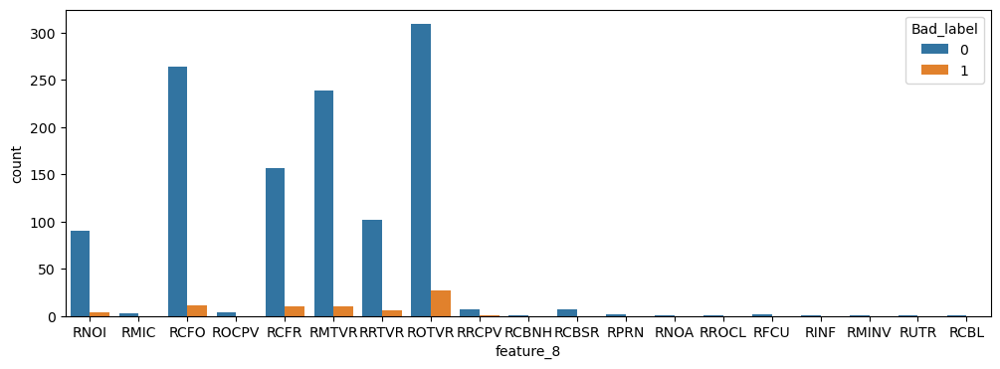

In [34]:
# feature_8

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_8',hue='Bad_label')
plt.show()

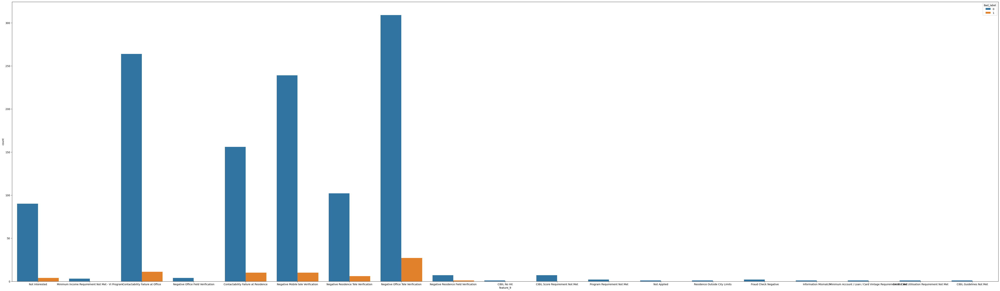

In [46]:
# feature_9

plt.figure(figsize=(70,20))
sns.countplot(data=data,x='feature_9',hue='Bad_label')
plt.show()

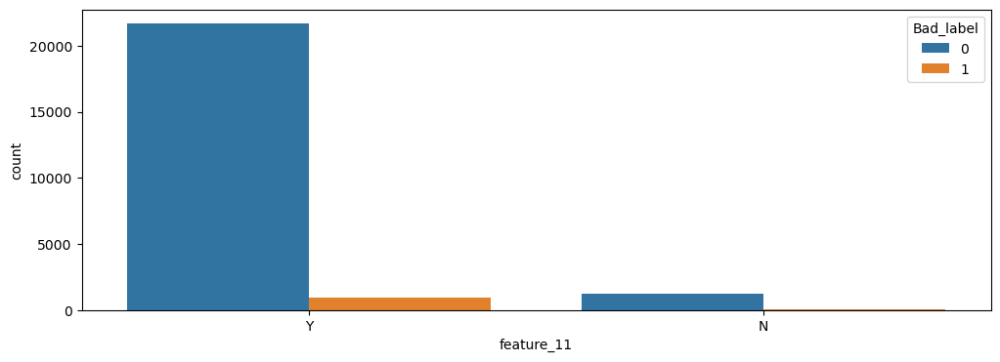

In [47]:
#feature_11

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_11',hue='Bad_label')
plt.show()

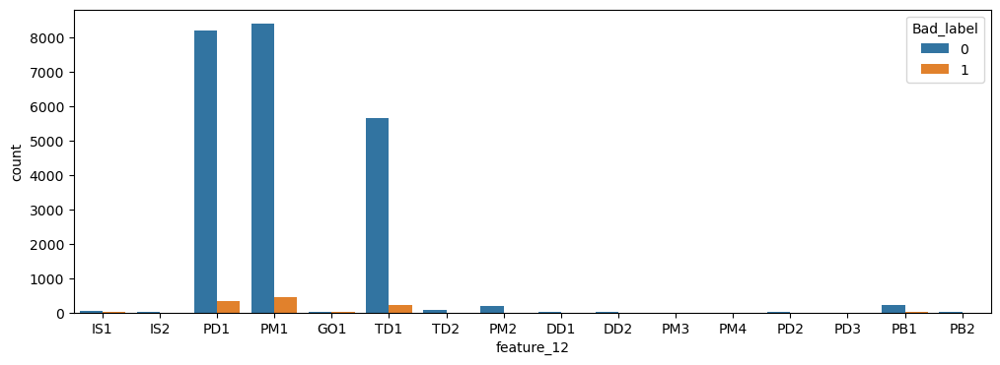

In [48]:
#feature_12

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_12',hue='Bad_label')
plt.show()

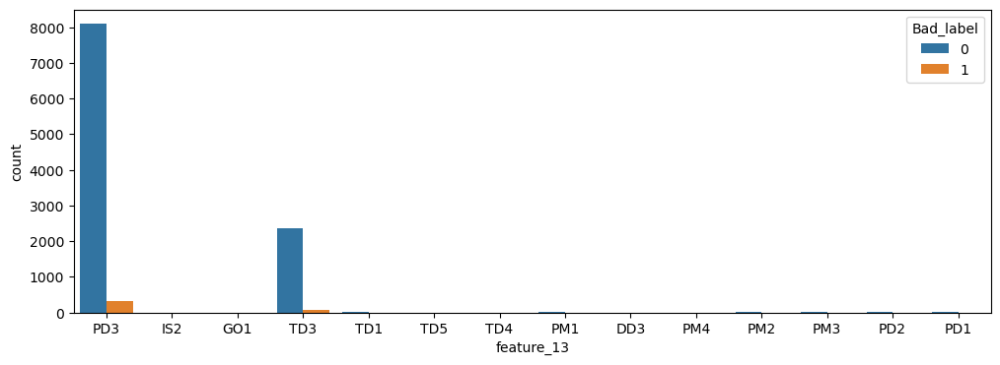

In [49]:
# feature_13

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_13',hue='Bad_label')
plt.show()

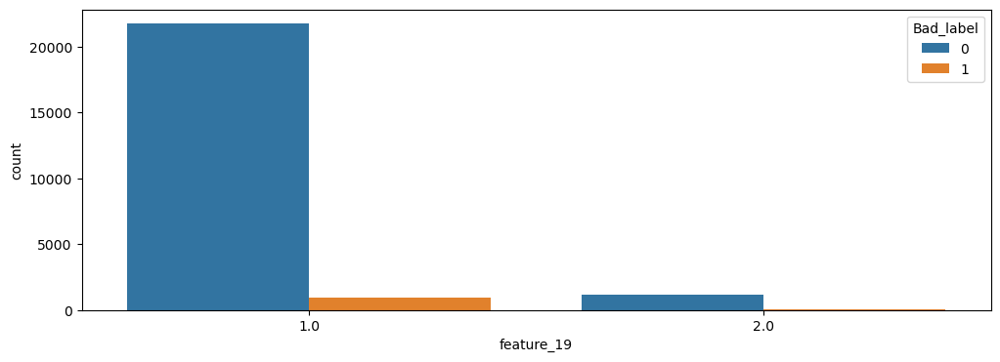

In [50]:
# feature_19

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_19',hue='Bad_label')
plt.show()

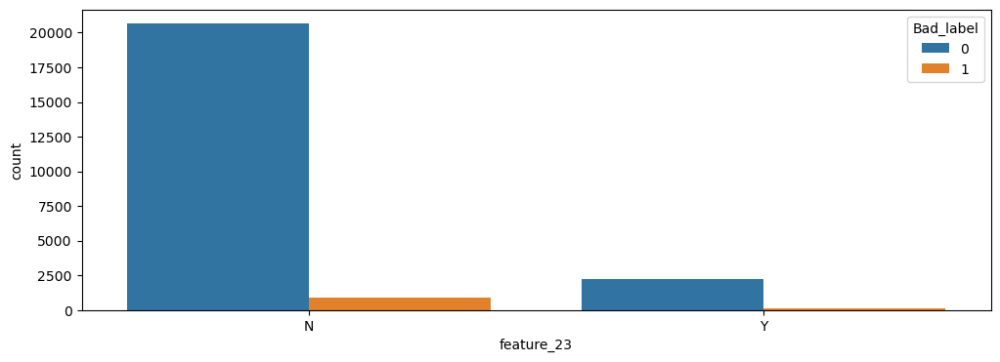

In [51]:
#feature_23

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_23',hue='Bad_label')
plt.show()

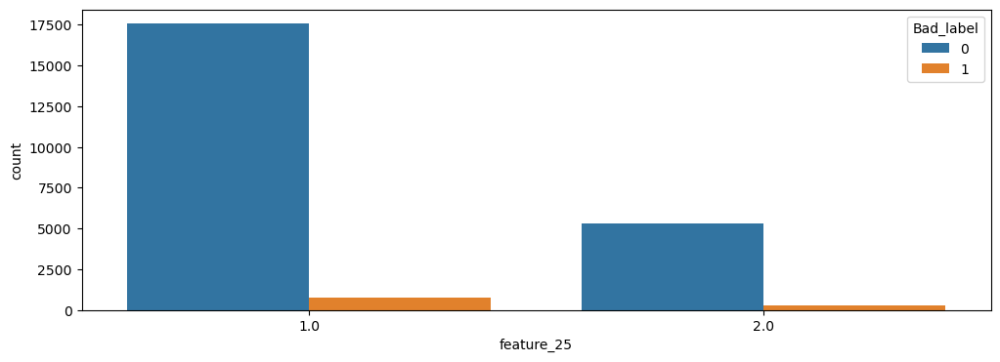

In [52]:
#feature_25

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_25',hue='Bad_label')
plt.show()

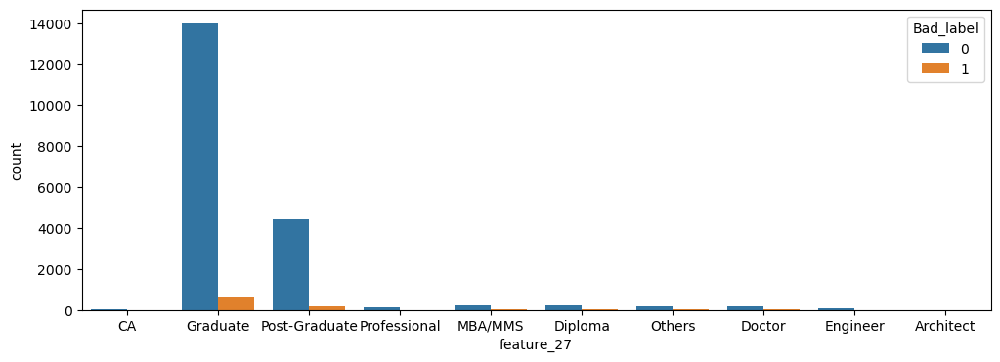

In [54]:
#feature_27

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_27',hue='Bad_label')
plt.show()

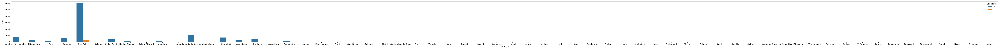

In [58]:
#feature_28

plt.figure(figsize=(95,4))
sns.countplot(data=data,x='feature_28',hue='Bad_label')
plt.show()

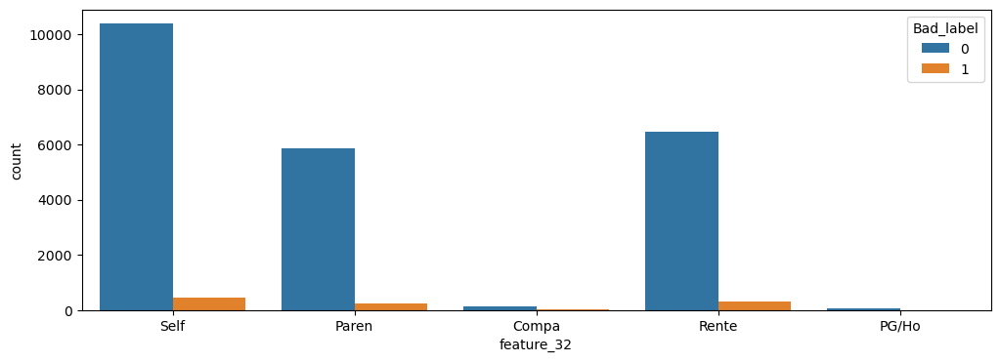

In [59]:
# feature_32

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_32',hue='Bad_label')
plt.show()

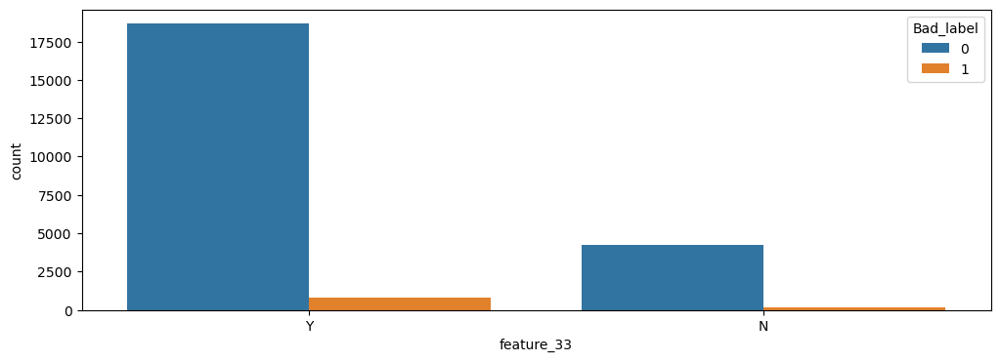

In [60]:
#feature_33

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_33',hue='Bad_label')
plt.show()

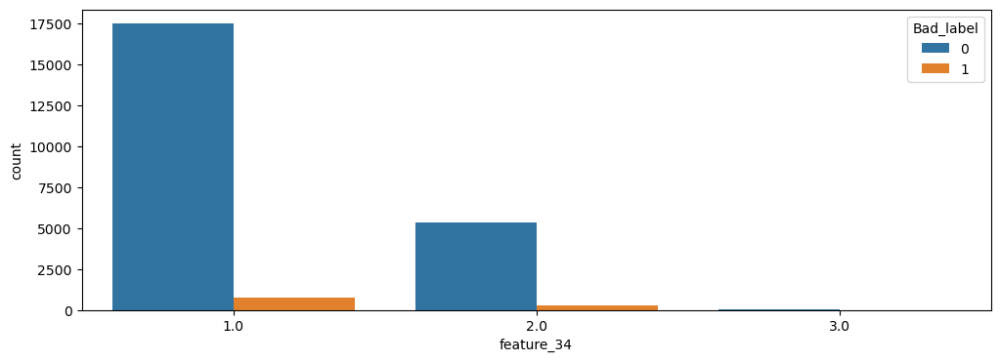

In [61]:
#feature_34

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_34',hue='Bad_label')
plt.show()

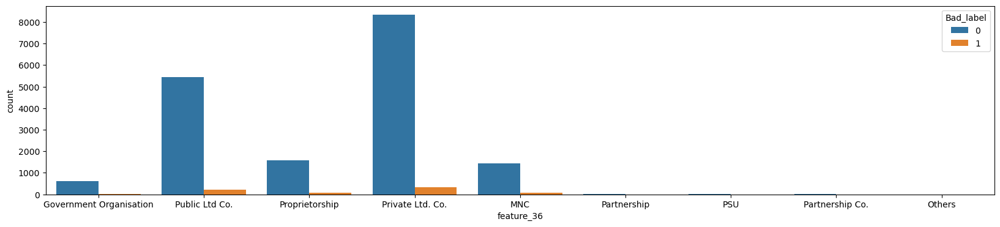

In [63]:
#feature_36

plt.figure(figsize=(20,4))
sns.countplot(data=data,x='feature_36',hue='Bad_label')
plt.show()

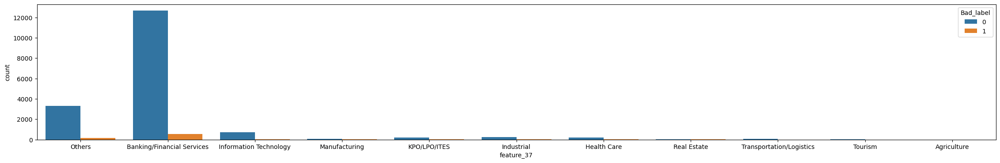

In [66]:
#feature_37

plt.figure(figsize=(28,4))
sns.countplot(data=data,x='feature_37',hue='Bad_label')
plt.show()

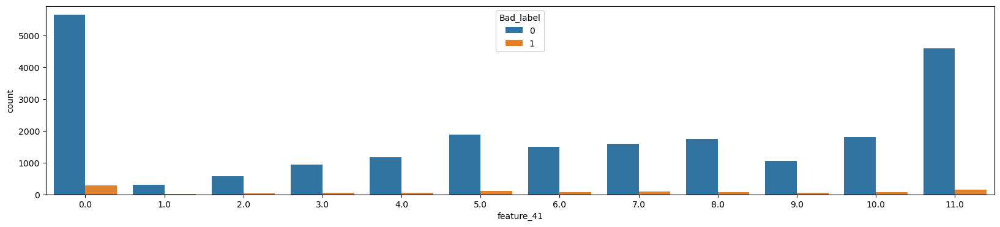

In [69]:
#feature_41

plt.figure(figsize=(20,4))
sns.countplot(data=data,x='feature_41',hue='Bad_label')
plt.show()

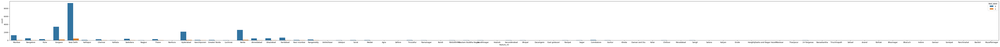

In [72]:
#feature_43

plt.figure(figsize=(100,4))
sns.countplot(data=data,x='feature_43',hue='Bad_label')
plt.show()

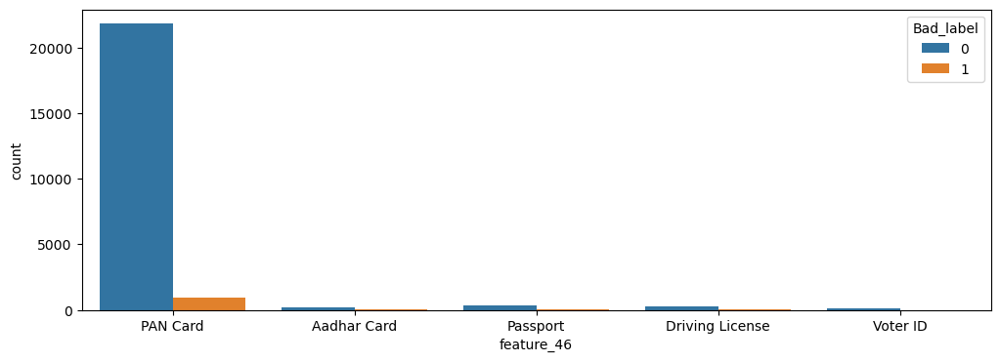

In [73]:
#feature_46

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_46',hue='Bad_label')
plt.show()

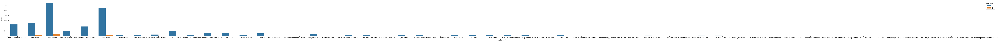

In [76]:
#feature_48

plt.figure(figsize=(110,4))
sns.countplot(data=data,x='feature_48',hue='Bad_label')
plt.show()

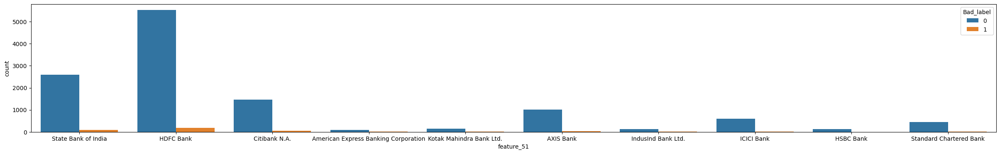

In [79]:
#feature_51

plt.figure(figsize=(30,4))
sns.countplot(data=data,x='feature_51',hue='Bad_label')
plt.show()

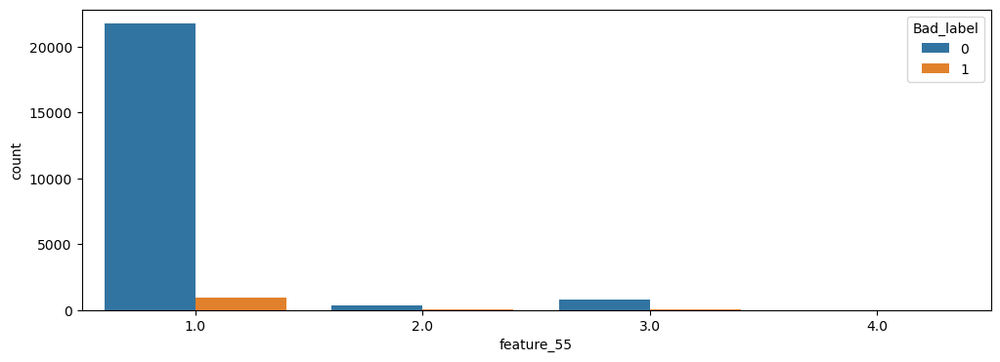

In [80]:
#feature_55

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_55',hue='Bad_label')
plt.show()

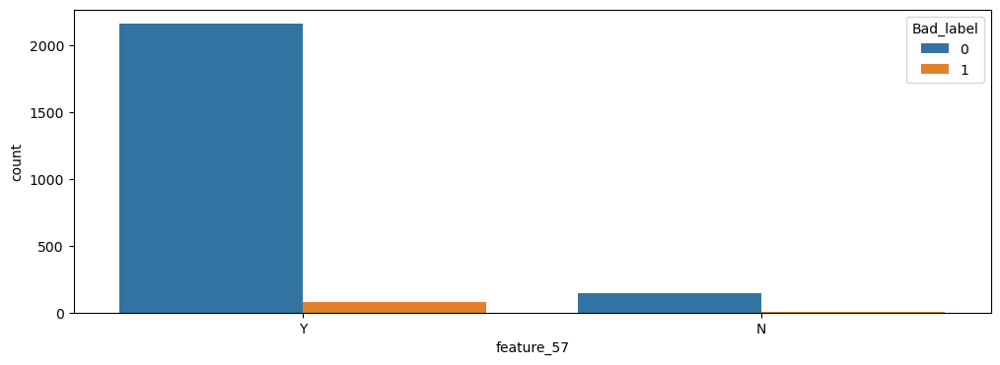

In [81]:
#feature_57

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_57',hue='Bad_label')
plt.show()

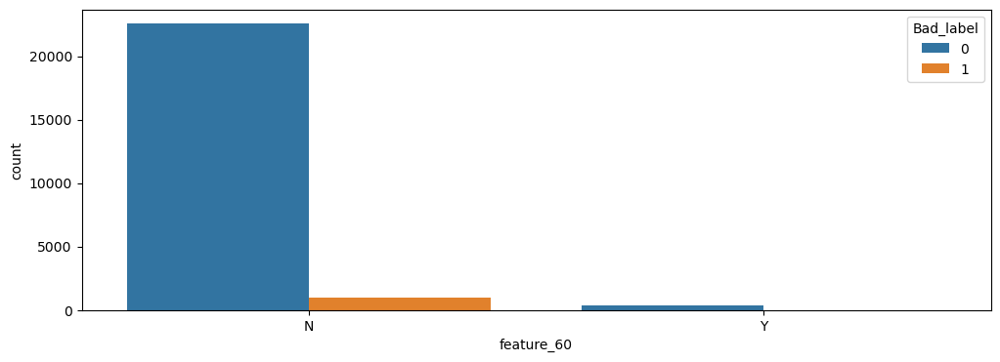

In [85]:
#feature_60

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_60',hue='Bad_label')
plt.show()

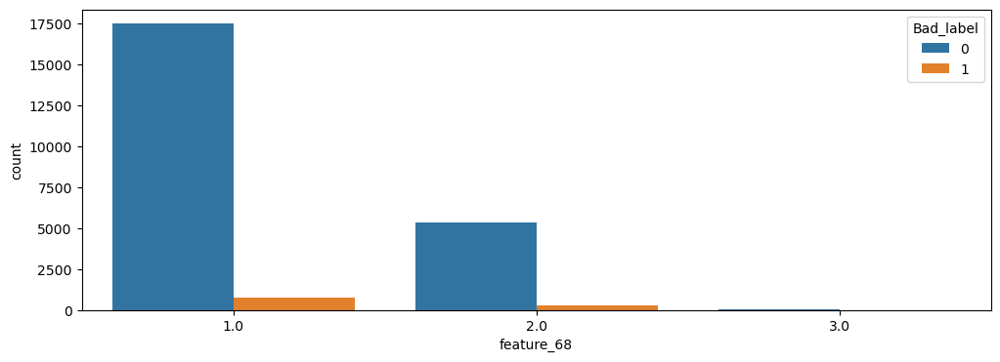

In [87]:
#feature_68

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_68',hue='Bad_label')
plt.show()

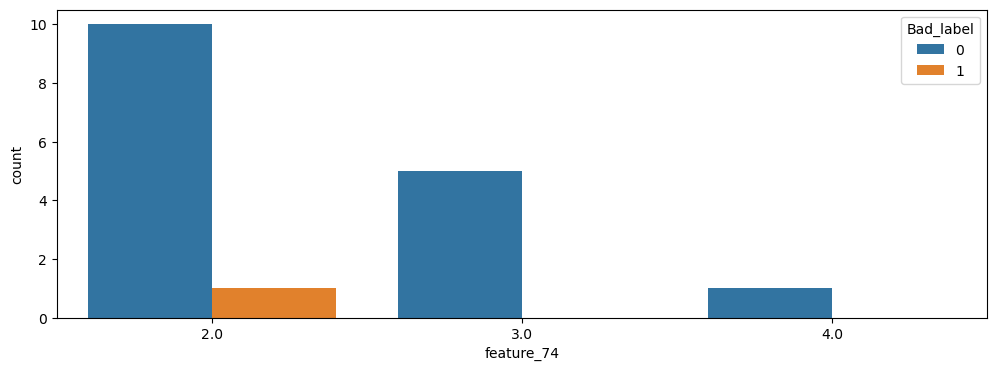

In [92]:
#feature_74

plt.figure(figsize=(12,4))
sns.countplot(data=data,x='feature_74',hue='Bad_label')
plt.show()

## Insight:-



* Maximum defaulter found in platinum maxima, platinum Deligh, Titanium Deligh and minimum defaulter found in RBL Bank Fun+, Insignia, Golf Card and Platinum Cricke.

* Due to feature_4 maximum defaulter found in 3.0 and minimum defaulter found in 2.0

* Due to feature_8 maximum defaulter found in ROTVR.

* Due to feature_9 maximum defaulter found in Contactability Failure at Resistance.

* Due to feature_11 defaulter found in Yes side.

* Due to feature_12 defaulter found in PD1,PM1 and PB1.

* Due to feature_13 defaulter found in PD3  and TD3.

* Due to feature_19 defaulter found is 1.0

* Due to feature_23 maximum defaulter found in No side.

* Due to feature_25 maximum defaulter found in 2.0

* Due to feature_27 maximum defaulter found in graduate and post-graduate.

* Due to feature_28 maximum defaulter found in New Delhi.

* Due to feature_32 defaulter found in self, parent and rent accommodation

* Due to feature_33 maximum defaulter found in yes side

* Due to feature_34 defaulter found in 1.0 and 2.0 not found in 3.0

* Due to feature_36 defaulter found in Public Ltd. Co., Private Ltd. Co. ,Proprietorship very few in MNC and Government Organisation.

* Due to feature_37 defaulter found in Bank/Financial Services and others.

* Due to feature_41 maximum defaulter found in 5.0

* Due to feature_43 maximum defaulter found in New Delhi, Gurgaon, Hyderabad and Noida.

* Due to feature_46 maximum defaulter found in PAN card holder customers.

* Due to feature_48 maximum defaulter found in HDFC Bank, ICICI Bank, Axis Bank and Kotak Mahindra Bank's customers.

* Due to feature_51 defaulter found in HDFC Bank, State Bank Of India ,Citi Bank N.A., Axis Bank

* Due to feature_55 defaulter found in 1.0, 2.0 and 3.0 and defaulter not found in 4.0

* Due to feature_57 defaulter found in yes side only.

* Due to feature_60 defaulter found in yes side only.

* Due to feature_68 defaulter found in 1.0 and 2.0 in 3.0 defaulter in not found.

* Due to feature_74 defaulter found in 2.0

  


In [96]:
feat1 = data.drop(['Unnamed: 0','dt_opened','customer_no','entry_time','feature_2','feature_10','feature_20','feature_21','feature_22','feature_24','feature_45','feature_47','feature_53','feature_54','feature_77','Bad_label','feature_18','feature_61','customer_no.1','high_credit_amt','cur_balance_amt','amt_past_due','cashlimit','creditlimit','total_enq_count','total_enq_amt'], axis=1)
feat1.sample(7)

,feature_1,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_19,feature_23,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_48,feature_49,feature_50,feature_51,feature_52,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_78,feature_79
4057,Titanium Deligh,700.0,3.0,Card Setup,14.0,83000.0,NaN,NaN,Y,TD1,NaN,0.0,MA20,AG01,NaN,1.0,N,1.0,3.0,Graduate,Mumbai / Navi Mumbai / Thane,400097.0,1987.0,0.0,Self,Y,1.0,25000.0,Public Ltd Co.,Banking/Financial Services,SR ACCOUNT ADMIN,2010.0,3.0,6.0,0.0,Mumbai,400069.0,PAN Card,Punjab National Bank,NaN,N,NaN,0.0,1.0,21.0,NaN,N,Y,N,Y,1987-0,21.0,15.0,400097.0,0.0,1.0,25000.0,0-0,21.0,O,NaN,NaN,0000-00-00,0.0,1.0,N
12373,Platinum Maxima,NaN,2.0,Card Setup,14.0,130000.0,NaN,NaN,Y,PM1,NaN,0.0,W01,3056,NaN,1.0,Y,1.0,0.0,Graduate,Mumbai / Navi Mumbai / Thane,401303.0,2010.0,0.0,Self,Y,1.0,43201.0,Proprietorship,Banking/Financial Services,EXEC FINANCE,2007.0,5.0,8.0,0.0,Mumbai,400093.0,PAN Card,Citibank N.A.,NaN,N,NaN,0.0,1.0,21.0,NaN,N,Y,N,Y,2010-0,21.0,315.0,401303.0,0.0,1.0,43201.0,0-0,21.0,O,NaN,NaN,0000-00-00,0.0,2.0,N
5454,Titanium Deligh,694.0,1.0,Card Setup,14.0,70000.0,NaN,NaN,Y,TD1,NaN,0.0,HA06,S202,NaN,1.0,N,2.0,0.0,Graduate,Hyderabad / Secunderabad,500006.0,1990.0,0.0,Paren,Y,1.0,28000.0,Private Ltd. Co.,Others,OFFICER,2014.0,3.0,5.0,0.0,Hyderabad,500065.0,PAN Card,NaN,NaN,Y,AXIS Bank,70000.0,1.0,2.0,NaN,N,Y,N,Y,1990-0,2.0,14.0,500006.0,0.0,1.0,28000.0,0-0,2.0,R,NaN,NaN,0000-00-00,0.0,1.0,N
11956,Platinum Maxima,724.0,3.0,Card Setup,14.0,106000.0,NaN,NaN,Y,PM1,NaN,NaN,SA03,AS32,NaN,1.0,N,1.0,0.0,Graduate,New Delhi,110053.0,1985.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,110053.0,PAN Card,NaN,NaN,N,NaN,0.0,1.0,10.0,NaN,N,Y,N,Y,1985-0,10.0,157.0,110053.0,0.0,2.0,1.0,Nov-00,10.0,R,NaN,NaN,0000-00-00,0.0,1.0,N
19981,Platinum Deligh,700.0,3.0,Card Setup,14.0,107000.0,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS33,NaN,1.0,N,1.0,0.0,Graduate,New Delhi,110062.0,2000.0,0.0,Self,Y,1.0,1.0,Public Ltd Co.,Banking/Financial Services,ADMIN,2008.0,4.0,5.0,0.0,New Delhi,110030.0,PAN Card,NaN,NaN,Y,HDFC Bank,75000.0,1.0,10.0,NaN,N,Y,N,Y,2000-0,10.0,157.0,110062.0,0.0,1.0,1.0,0-0,10.0,O,NaN,NaN,0000-00-00,0.0,1.0,N
14525,Platinum Maxima,749.0,1.0,Card Setup,14.0,141000.0,NaN,NaN,Y,PM1,NaN,NaN,CD01,D066,NaN,1.0,Y,1.0,0.0,Graduate,New Delhi,110034.0,1984.0,11.0,Paren,Y,1.0,1.0,Proprietorship,KPO/LPO/ITES,AM,2014.0,9.0,8.0,0.0,Gurgaon,122001.0,PAN Card,NaN,NaN,N,NaN,0.0,1.0,10.0,Y,N,Y,N,Y,1984-11,10.0,157.0,110034.0,0.0,1.0,1.0,0-0,13.0,R,N,NaN,0000-00-00,0.0,1.0,N
15523,Platinum Deligh,676.0,3.0,Card Setup,14.0,78000.0,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS16,NaN,1.0,N,1.0,2.0,Post-Graduate,New Delhi,110035.0,2004.0,3.0,Rente,N,1.0,54052.0,MNC,Information Technology,TEAM LEAD,2015.0,2.0,11.0,0.0,Noida,201301.0,PAN Card,ICICI Bank,NaN,N,NaN,0.0,1.0,10.0,NaN,N,Y,N,Y,2004-3,33.0,56.0,208016.0,1.0,1.0,54052.0,0-0,33.0,R,NaN,NaN,0000-00-00,0.0,1.0,N


***iii).Multivariate Analysis***

In [97]:
sns.pairplot(feat1)
plt.show()

# 7.Data Preprocessing

**i).Remove Special Characters**

In [46]:
data = data.replace('[\£#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~]','',regex=True)

* '[\£#$%&'()*+,-./:;<=>?@[\]^_{|}~]': This is the regular expression pattern enclosed in square brackets. It specifies a range of special characters that should be replaced. The double backslashes (\) are used to escape special characters within the regular expression.

* ' ': This empty string is the replacement value. In this case, it means that the matched special characters will be replaced with nothing, effectively removing them.

* regex=True: This parameter indicates that the pattern to be replaced is a regular expression.

* After executing this code, the data DataFrame will have had all instances of the specified special characters removed from its content, as specified by the regular expression pattern.

**About Target Column**

In [47]:
data.Bad_label.value_counts()

Bad_label
0    22892
1     1004
Name: count, dtype: int64

* From the above code we receive a series that shows the counts of each unique value in the 'Bad_label' column of the DataFrame. This is useful for understanding the distribution of values in that specific column, particularly for categorical or discrete data.

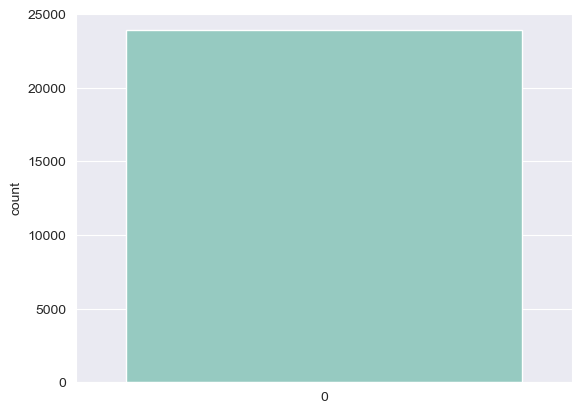

In [48]:
plt.style.use("dark_background")
sns.set_style('darkgrid')
sns.countplot(data.Bad_label)
plt.show()

This code configures the style of the plots, creates a countplot using Seaborn to visualize the distribution of values in the 'Bad_label' column, and then displays the plot with a dark background and gridlines for better visualization. 

* In this plot we clearly see that 90% Customers have Good credit and 10% customers do not have Good credit.
* This target feature is not balanced.

**ii).Checking Missing Values**

In [49]:
pd.set_option('display.max_rows',None)
data.isnull().sum()

Unnamed: 0             0
dt_opened              0
customer_no            0
entry_time            15
feature_1             15
feature_2           2836
feature_3           2836
feature_4             15
feature_5             15
feature_7             15
feature_8          22635
feature_9          22635
feature_10         23845
feature_11            15
feature_12            15
feature_13         13004
feature_14          7733
feature_15            23
feature_16            27
feature_17         22869
feature_18         23878
feature_19            15
feature_20             0
feature_21            15
feature_22             0
feature_23            15
feature_24           640
feature_25            15
feature_26            15
feature_27          3637
feature_28            15
feature_29            15
feature_30            15
feature_31            15
feature_32            15
feature_33            15
feature_34            15
feature_35            15
feature_36          5682
feature_37          5682


* After executing this code, we will see a Series that displays the count of missing values in each column of the data DataFrame. By setting max_rows to None, we ensure that all rows are displayed when viewing the result. This is useful for checking the presence of missing data in our dataset.

* In this data set most of the feature contain missing values with including unique feature.

* Numerical feature missing value impute with Median/Mean.

* Categorical feature missing value impute with mode(use fillna function to impute categorical value).

In [50]:
#Create function to check missing value with percentage

def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
missing_value(data)

,Missing Number,Missing Percentage
Unnamed: 0,0,0.000000
dt_opened,0,0.000000
customer_no,0,0.000000
entry_time,15,0.062772
feature_1,15,0.062772
feature_2,2836,11.868095
feature_3,2836,11.868095
feature_4,15,0.062772
feature_5,15,0.062772
feature_7,15,0.062772


* def missing_value(data)::This line defines a Python function named missing_value that takes a DataFrame (data) as an input parameter.

* null_value = data.isnull().sum():This line calculates the number of missing values in each column of the DataFrame data using the .isnull().sum() method. It stores the result in a Series called null_value.

* percentage = (data.isnull().sum() / data.isnull().count() * 100):This line calculates the percentage of missing values in each column of the DataFrame data by dividing the number of missing values by the total count of values (both missing and non-missing) and then multiplying by 100. The result is stored in a Series called percentage

* null_value = pd.concat([null_value, percentage], axis=1, keys=['Missing Number', 'Missing Percentage']):This line combines the two sets of information, the number of missing values (null_value) and the missing percentage (percentage), into a single DataFrame using the pd.concat() function. It sets column names ('Missing Number' and 'Missing Percentage') for the resulting DataFrame.

* return null_value:This line returns the combined DataFrame containing information about missing values, which includes the number of missing values and the corresponding percentage for each column.

In [51]:
data_1 = ['feature_8','feature_9','feature_10','feature_13','feature_14','feature_17',
'feature_18','feature_38','feature_45',
'feature_49','feature_51','feature_53','feature_57','feature_61','feature_73','feature_74','amt_past_due']

* In this list, each string element corresponds to the name of a feature or column in a dataset. These features are identified by their names, such as 'feature_8', 'feature_9', 'amt_past_due', and so on. This list can be used to reference or filter specific columns when working with a DataFrame, for example, when selecting or analyzing specific data columns.

In [52]:
data.drop(data_1, inplace=True, axis=1)

* 17 Features has more than 15% to 90% missing value and some unique feature also contain missing value so we drop this feature.

* Remaining feature missing value is less than 15% so we impute the missing value.

* After executing this code, the columns listed in the data_1 list will be removed from the data DataFrame, and the DataFrame will be modified accordingly, with those columns no longer present.

In [53]:
data.isnull().sum().sum()

50089

* The total count of missing values in the entire data DataFrame is 50089. This is a useful metric for assessing the overall data quality and identifying missing data in our dataset.

#### ***Numerical Columns :-***

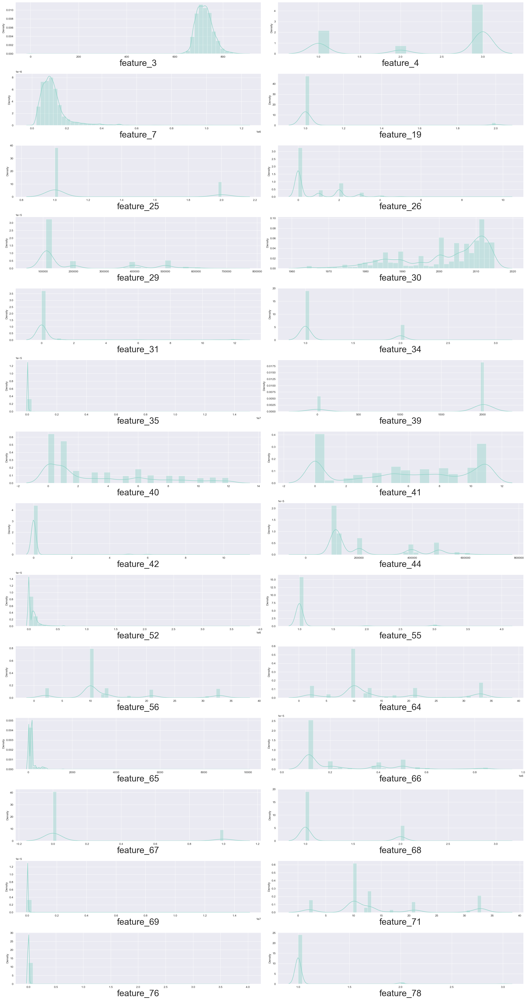

In [54]:
numerical_col = data[['feature_3','feature_4','feature_7','feature_19','feature_25','feature_26','feature_29','feature_30',
'feature_31','feature_34','feature_35','feature_39','feature_40','feature_41','feature_42','feature_44','feature_52',
'feature_55','feature_56','feature_64','feature_65','feature_66','feature_67','feature_68','feature_69','feature_71','feature_76',
'feature_78']]


sns.set_style('darkgrid')
plt.figure(figsize=(25,50)) # defining canvas size
plotnum = 1 # counter

for column in numerical_col: # iteration of columns / acessing the columns from  dataset
    if plotnum<=30:    # set the limit
        plt.subplot(15,2,plotnum) # # plotting 28 graphs (15-rows,2-columns) And plotnumber is for count
        sns.distplot(x=numerical_col[column]) # Plotting distribution plots
        plt.xlabel(column,fontsize=30)  # assigning name to x-axis and font size is 30

    plotnum+=1 # counter increment
plt.tight_layout()
plt.show()

In [55]:
numerical_col.columns

Index(['feature_3', 'feature_4', 'feature_7', 'feature_19', 'feature_25',
       'feature_26', 'feature_29', 'feature_30', 'feature_31', 'feature_34',
       'feature_35', 'feature_39', 'feature_40', 'feature_41', 'feature_42',
       'feature_44', 'feature_52', 'feature_55', 'feature_56', 'feature_64',
       'feature_65', 'feature_66', 'feature_67', 'feature_68', 'feature_69',
       'feature_71', 'feature_76', 'feature_78'],
      dtype='object')

* From the above code we receive a list or index of column names that are present in the numerical_data DataFrame. This can be useful for reviewing the names of the numerical columns in our dataset or for further data manipulation and analysis.

In [56]:
data[numerical_col.columns] = data[numerical_col.columns].fillna(data[numerical_col.columns].median())

* The code essentially replaces missing values in the specified numerical columns with the median value of each column, ensuring that the dataset is filled with meaningful values for further analysis or modeling.

In [57]:
#Create function to check missing value with percentage

def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
missing_value(data)

,Missing Number,Missing Percentage
Unnamed: 0,0,0.000000
dt_opened,0,0.000000
customer_no,0,0.000000
entry_time,15,0.062772
feature_1,15,0.062772
feature_2,2836,11.868095
feature_3,0,0.000000
feature_4,0,0.000000
feature_5,15,0.062772
feature_7,0,0.000000


* null_value = pd.concat([null_value, percentage], axis=1, keys=['Missing Number', 'Missing Percentage']):This line combines the two sets of information, the number of missing values (null_value) and the missing percentage (percentage), into a single DataFrame using the pd.concat() function. It sets column names ('Missing Number' and 'Missing Percentage') for the resulting DataFrame.

* return null_value:This line returns the combined DataFrame containing information about missing values, which includes the number of missing values and the corresponding percentage for each column.

#### ***Categorical Columns:-***

* mode(use fillna function to impute categorical value)

In [58]:
categorical_col = data[['entry_time','feature_1', 'feature_2', 'feature_5', 'feature_11','feature_12',
                         'feature_15','feature_16','feature_21','feature_23','feature_24','feature_27',
                         'feature_28','feature_32','feature_33','feature_36','feature_37','feature_43',
                         'feature_46','feature_48','feature_50','feature_54','feature_58','feature_59',
                         'feature_60','feature_62','feature_63','feature_70','feature_72','feature_75',
                         'feature_79','high_credit_amt','cashlimit','creditlimit']]

* By creating this categorical_data DataFrame, we can work specifically with the categorical columns for analysis, visualization, or any other operations that are relevant to non-numeric data.

In [59]:
categorical_col.columns

Index(['entry_time', 'feature_1', 'feature_2', 'feature_5', 'feature_11',
       'feature_12', 'feature_15', 'feature_16', 'feature_21', 'feature_23',
       'feature_24', 'feature_27', 'feature_28', 'feature_32', 'feature_33',
       'feature_36', 'feature_37', 'feature_43', 'feature_46', 'feature_48',
       'feature_50', 'feature_54', 'feature_58', 'feature_59', 'feature_60',
       'feature_62', 'feature_63', 'feature_70', 'feature_72', 'feature_75',
       'feature_79', 'high_credit_amt', 'cashlimit', 'creditlimit'],
      dtype='object')

* When we execute categorical_data.columns, we will receive a list or index of column names that are present in the categorical_data DataFrame. This can be useful for reviewing the names of the categorical columns in our dataset or for further data manipulation and analysis.

In [60]:
data['entry_time'] = data['entry_time'].fillna(data['entry_time'].mode()[0])
data['feature_1'] = data['feature_1'].fillna(data['feature_1'].mode()[0])
data['feature_2'] = data['feature_2'].fillna(data['feature_2'].mode()[0])
data['feature_5'] = data['feature_5'].fillna(data['feature_5'].mode()[0])
data['feature_11'] = data['feature_11'].fillna(data['feature_11'].mode()[0])
data['feature_12'] = data['feature_12'].fillna(data['feature_12'].mode()[0])
data['feature_15'] = data['feature_15'].fillna(data['feature_15'].mode()[0])
data['feature_16'] = data['feature_16'].fillna(data['feature_16'].mode()[0])
data['feature_21'] = data['feature_21'].fillna(data['feature_21'].mode()[0])
data['feature_23'] = data['feature_23'].fillna(data['feature_23'].mode()[0])
data['feature_24'] = data['feature_24'].fillna(data['feature_24'].mode()[0])
data['feature_27'] = data['feature_27'].fillna(data['feature_27'].mode()[0])
data['feature_28'] = data['feature_28'].fillna(data['feature_28'].mode()[0])
data['feature_32'] = data['feature_32'].fillna(data['feature_32'].mode()[0])
data['feature_33'] = data['feature_33'].fillna(data['feature_33'].mode()[0])
data['feature_36'] = data['feature_36'].fillna(data['feature_36'].mode()[0])
data['feature_37'] = data['feature_37'].fillna(data['feature_37'].mode()[0])
data['feature_43'] = data['feature_43'].fillna(data['feature_43'].mode()[0])
data['feature_46'] = data['feature_46'].fillna(data['feature_46'].mode()[0])
data['feature_48'] = data['feature_48'].fillna(data['feature_48'].mode()[0])
data['feature_50'] = data['feature_50'].fillna(data['feature_50'].mode()[0])
data['feature_54'] = data['feature_54'].fillna(data['feature_54'].mode()[0])
data['feature_58'] = data['feature_58'].fillna(data['feature_58'].mode()[0])
data['feature_59'] = data['feature_59'].fillna(data['feature_59'].mode()[0])
data['feature_60'] = data['feature_60'].fillna(data['feature_60'].mode()[0])
data['feature_62'] = data['feature_62'].fillna(data['feature_62'].mode()[0])
data['feature_63'] = data['feature_63'].fillna(data['feature_63'].mode()[0])
data['feature_70'] = data['feature_70'].fillna(data['feature_70'].mode()[0])
data['feature_72'] = data['feature_72'].fillna(data['feature_72'].mode()[0])
data['feature_75'] = data['feature_75'].fillna(data['feature_75'].mode()[0])
data['feature_79'] = data['feature_79'].fillna(data['feature_79'].mode()[0])
data['high_credit_amt'] = data['high_credit_amt'].fillna(data['high_credit_amt'].mode()[0])
data['cashlimit'] = data['cashlimit'].fillna(data['cashlimit'].mode()[0])
data['creditlimit'] = data['creditlimit'].fillna(data['creditlimit'].mode()[0])

* The above code effectively replaces missing values in each of the specified columns with the most frequent value found in that column, ensuring that the dataset is filled with meaningful data for analysis or modeling.

In [61]:
#Create function to check missing value with percentage

def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
missing_value(data)

,Missing Number,Missing Percentage
Unnamed: 0,0,0.0
dt_opened,0,0.0
customer_no,0,0.0
entry_time,0,0.0
feature_1,0,0.0
feature_2,0,0.0
feature_3,0,0.0
feature_4,0,0.0
feature_5,0,0.0
feature_7,0,0.0


* The above code returns the combined DataFrame containing information about missing values, which includes the number of missing values and the corresponding percentage for each column.

**iii).Convert Categorical into Numerical**

In [62]:
data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_47,feature_48,feature_50,feature_52,feature_54,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18Apr15,1,13Apr15,Insignia,13Apr15,650.0,2.0,Card Setup,500000.0,Y,IS1,159,4284,1.0,ADFPNXXXXX,03Sep65,98332XXXXX,N,REDIFFMAILCOM,1.0,2.0,Graduate,Mumbai Navi Mumbai Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,Private Ltd Co,BankingFinancial Services,0.0,0.0,0.0,0.0,Mumbai,400059.0,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd,Y,0.0,17Jun16,1.0,21.0,Y,Y,N,Y,19650,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov00,21.0,R,00000000,0.0,98332XXXXX,1.0,N,0,2528846125459139765171256290596200000020000009...,2528846588820003759832549017546780000093630000,168000,250000420000,1,18,4.981150e+06
1,1,21Apr15,2,21Apr15,Insignia,21Apr15,760.0,1.0,Card Setup,1200000.0,Y,IS1,91,B001,1.0,AJWPRXXXXX,14Jul62,99455XXXXX,N,GMAILCOM,1.0,2.0,Graduate,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,Private Ltd Co,BankingFinancial Services,0.0,0.0,0.0,0.0,Bangalore,560042.0,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd,N,0.0,17Jun16,1.0,17.0,Y,Y,N,Y,19690,17.0,12.0,560042.0,0.0,2.0,1.0,Nov00,17.0,R,00000000,0.0,99455XXXXX,1.0,N,0,1000000117595,674724007,1,1000000,2,68,6.676682e+09
2,2,22Apr15,3,21Apr15,Insignia,21Apr15,774.0,1.0,Card Setup,700000.0,Y,IS1,91,B001,2.0,AFAPNXXXXX,10Apr66,98456XXXXX,N,SHOBANARAYANCOM,1.0,0.0,Graduate,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,Private Ltd Co,BankingFinancial Services,0.0,0.0,0.0,0.0,Bangalore,560042.0,PAN Card,AFAPNXXXXX,HDFC Bank,N,0.0,17Jun16,3.0,17.0,N,Y,N,Y,19660,17.0,12.0,560042.0,0.0,2.0,1.0,Nov00,17.0,R,00000000,0.0,98456XXXXX,1.0,N,0,121523,17864,10000,50000,3,1,3.400000e+06
3,3,25Apr15,4,15Apr15,Insignia,20Apr15,770.0,1.0,Card Setup,500000.0,Y,IS1,157,5107,1.0,AAAPDXXXXX,16Apr64,98220XXXXX,N,VSNLCOM,1.0,3.0,Graduate,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,Private Ltd Co,BankingFinancial Services,0.0,0.0,0.0,0.0,Pune,411026.0,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd,Y,0.0,17Jun16,1.0,21.0,Y,Y,N,Y,19880,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov00,21.0,R,61565,1.0,98220XXXXX,1.0,N,0,4449180000050000011650007500003000000300000056...,01637496000000868862121189000000,23600010500020000,394000262000300000,4,34,5.081000e+07
4,4,06May15,5,30Apr15,Insignia,19Oct15,721.0,3.0,Card Setup,500000.0,Y,IS1,100,D016,1.0,ABEPSXXXXX,03Jan54,98111XXXXX,N,REDIFFMAILCOM,1.0,3.0,Graduate,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,Private Ltd Co,BankingFinancial Services,0.0,0.0,0.0,0.0,Gurgaon,122009.0,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd,N,0.0,17Jun16,1.0,13.0,Y,Y,N,Y,19950,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov00,13.0,R,00000000,0.0,98111XXXXX,1.0,N,0,1501591266293822042204,7973000000,10000,50000,5,2,2.000000e+03


In [63]:
categorical_col.columns

Index(['entry_time', 'feature_1', 'feature_2', 'feature_5', 'feature_11',
       'feature_12', 'feature_15', 'feature_16', 'feature_21', 'feature_23',
       'feature_24', 'feature_27', 'feature_28', 'feature_32', 'feature_33',
       'feature_36', 'feature_37', 'feature_43', 'feature_46', 'feature_48',
       'feature_50', 'feature_54', 'feature_58', 'feature_59', 'feature_60',
       'feature_62', 'feature_63', 'feature_70', 'feature_72', 'feature_75',
       'feature_79', 'high_credit_amt', 'cashlimit', 'creditlimit'],
      dtype='object')

* This information is valuable for reviewing and referencing the names of categorical columns in the dataset, which is helpful for data analysis and manipulation tasks specific to categorical data.

***Using Label Encoading:-***

In [64]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()
data.entry_time=label.fit_transform(data.entry_time)
data.feature_1=label.fit_transform(data.feature_1)
data.feature_2=label.fit_transform(data.feature_2)
data.feature_5=label.fit_transform(data.feature_5)
data.feature_11=label.fit_transform(data.feature_11)
data.feature_12=label.fit_transform(data.feature_12)
data.feature_15=label.fit_transform(data.feature_15)
data.feature_16=label.fit_transform(data.feature_16)
data.feature_21=label.fit_transform(data.feature_21)
data.feature_23=label.fit_transform(data.feature_23)
data.feature_24=label.fit_transform(data.feature_24)
data.feature_27=label.fit_transform(data.feature_27)
data.feature_28=label.fit_transform(data.feature_28)
data.feature_32=label.fit_transform(data.feature_32)
data.feature_33=label.fit_transform(data.feature_33)
data.feature_36=label.fit_transform(data.feature_36)
data.feature_37=label.fit_transform(data.feature_37)
data.feature_43=label.fit_transform(data.feature_43)
data.feature_46=label.fit_transform(data.feature_46)
data.feature_48=label.fit_transform(data.feature_48)
data.feature_50=label.fit_transform(data.feature_50)
data.feature_54=label.fit_transform(data.feature_54)
data.feature_58=label.fit_transform(data.feature_58)
data.feature_59=label.fit_transform(data.feature_59)
data.feature_60=label.fit_transform(data.feature_60)
data.feature_62=label.fit_transform(data.feature_62)
data.feature_63=label.fit_transform(data.feature_63)
data.feature_70=label.fit_transform(data.feature_70)
data.feature_72=label.fit_transform(data.feature_72)
data.feature_75=label.fit_transform(data.feature_75)
data.feature_79=label.fit_transform(data.feature_79)
data.high_credit_amt=label.fit_transform(data.high_credit_amt)
data.creditlimit=label.fit_transform(data.creditlimit)
data.cashlimit=label.fit_transform(data.cashlimit)
data.cur_balance_amt=label.fit_transform(data.cur_balance_amt)

* The LabelEncoder is used to convert categorical data into numerical values.

* label = LabelEncoder()-This line creates an instance of the LabelEncoder class, which will be used to perform the label encoding.

* data.entry_time = label.fit_transform(data.entry_time)-This line encodes the 'entry_time' column in the data DataFrame. It replaces the categorical values in this column with numerical labels using the fit_transform method of the LabelEncoder instance.

* Similar encoding is performed for multiple columns, such as 'feature_1', 'feature_2', 'feature_5', and so on, using the same LabelEncoder instance.Each line follows the same pattern: the specified column is encoded, replacing its categorical values with numerical labels.

In [65]:
data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_47,feature_48,feature_50,feature_52,feature_54,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18Apr15,1,116,1,108,650.0,2.0,0,500000.0,1,3,25,41,1.0,ADFPNXXXXX,936,98332XXXXX,0,467,1.0,2.0,5,39,400610.0,1965.0,0.0,4,1,2.0,90000.0,6,1,0.0,0.0,0.0,0.0,43,400059.0,2,ADFPNXXXXX,50,1,0.0,0,1.0,21.0,1,1,0,1,1,21.0,15.0,400610.0,0.0,2.0,90000.0,130,21.0,1,0,0.0,98332XXXXX,1.0,0,0,9173,12173,2847,4429,1,18,4.981150e+06
1,1,21Apr15,2,198,1,186,760.0,1.0,0,1200000.0,1,3,85,146,1.0,AJWPRXXXXX,3966,99455XXXXX,0,193,1.0,2.0,5,9,560042.0,1969.0,0.0,4,1,2.0,1.0,6,1,0.0,0.0,0.0,0.0,6,560042.0,2,AJWPRXXXXX,50,0,0.0,0,1.0,17.0,1,1,0,1,13,17.0,12.0,560042.0,0.0,2.0,1.0,130,17.0,1,0,0.0,99455XXXXX,1.0,0,0,13,20729,0,3,2,68,6.676682e+09
2,2,22Apr15,3,198,1,186,774.0,1.0,0,700000.0,1,3,85,146,2.0,AFAPNXXXXX,2676,98456XXXXX,0,505,1.0,0.0,5,9,560042.0,1966.0,0.0,4,1,2.0,1.0,6,1,0.0,0.0,0.0,0.0,6,560042.0,2,AFAPNXXXXX,19,0,0.0,0,3.0,17.0,0,1,0,1,4,17.0,12.0,560042.0,0.0,2.0,1.0,130,17.0,1,0,0.0,98456XXXXX,1.0,0,0,2287,8956,2,6486,3,1,3.400000e+06
3,3,25Apr15,4,138,1,177,770.0,1.0,0,500000.0,1,3,23,56,1.0,AAAPDXXXXX,4468,98220XXXXX,0,595,1.0,3.0,5,45,411001.0,1988.0,0.0,4,1,2.0,100000.0,6,1,0.0,0.0,0.0,0.0,51,411026.0,2,AAAPDXXXXX,50,1,0.0,0,1.0,21.0,1,1,0,1,185,21.0,16.0,411001.0,0.0,2.0,100000.0,130,21.0,1,50,1.0,98220XXXXX,1.0,0,0,15923,1834,3999,5708,4,34,5.081000e+07
4,4,06May15,5,282,1,175,721.0,3.0,0,500000.0,1,3,2,183,1.0,ABEPSXXXXX,763,98111XXXXX,0,467,1.0,3.0,5,23,122009.0,1995.0,0.0,4,1,2.0,300000.0,6,1,0.0,0.0,0.0,0.0,28,122009.0,2,ABEPSXXXXX,50,0,0.0,0,1.0,13.0,1,1,0,1,256,13.0,3.0,122009.0,0.0,2.0,300000.0,130,13.0,1,0,0.0,98111XXXXX,1.0,0,0,4039,21887,2,6486,5,2,2.000000e+03


**iv).Outlier Handling**

In [66]:
len(data.columns)

74

* The above code calculates and displays the total number of columns in the data DataFrame. This information is useful for understanding the dimensionality of the dataset and is often used in data exploration and analysis.

In [67]:
data_2 = data[['entry_time', 'feature_1',
       'feature_2', 'feature_3', 'feature_4', 'feature_5', 'feature_7',
       'feature_11', 'feature_12', 'feature_15', 'feature_16', 'feature_19',
       'feature_21', 'feature_23', 'feature_24',
       'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29',
       'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34',
       'feature_35', 'feature_36', 'feature_37', 'feature_39', 'feature_40',
       'feature_41', 'feature_42', 'feature_43', 'feature_44', 'feature_46',
       'feature_48', 'feature_50', 'feature_52', 'feature_54',
       'feature_55', 'feature_56', 'feature_58', 'feature_59', 'feature_60',
       'feature_62', 'feature_63', 'feature_64', 'feature_65', 'feature_66',
       'feature_67', 'feature_68', 'feature_69', 'feature_70', 'feature_71',
       'feature_72', 'feature_75', 'feature_76', 'feature_78',
       'feature_79','high_credit_amt', 'cur_balance_amt',
       'cashlimit', 'creditlimit', 'customer_no.1', 'total_enq_count',
       'total_enq_amt']]

* data_2 contains a subset of columns from the original dataset that we have selected for further analysis, modeling.

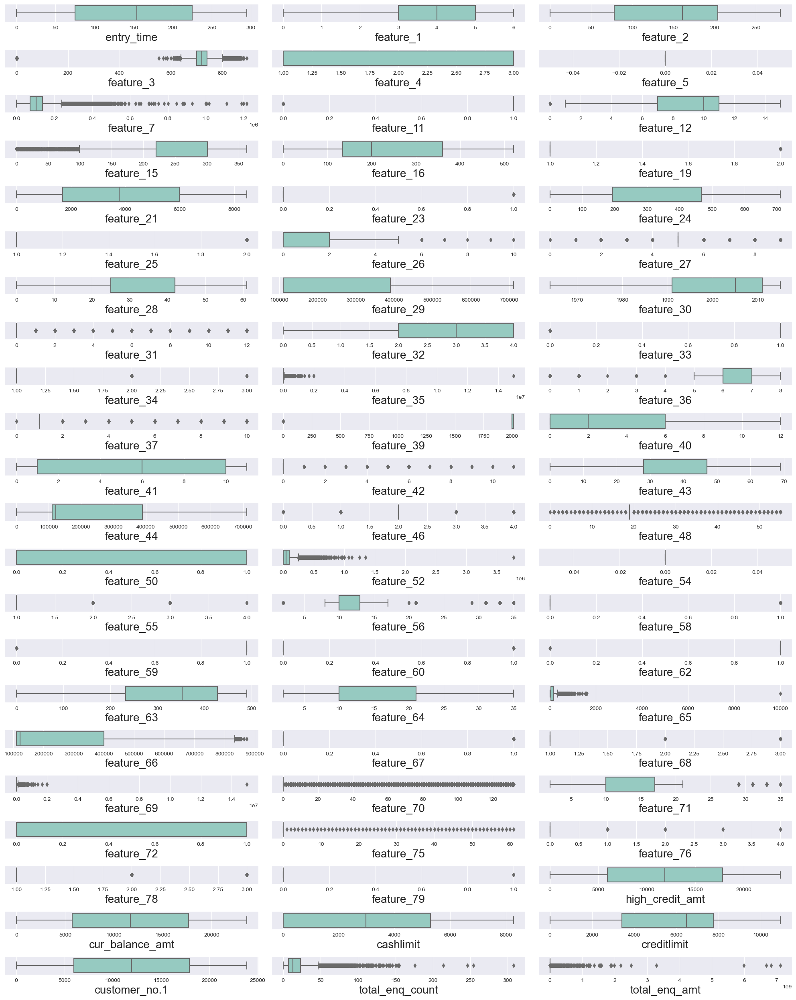

In [68]:
plt.figure(figsize=(20,25)) # defining canvas size
plotnum = 1 # counter

for column in data_2: # iteration of columns / acessing the columns from  dataset
    if plotnum<=70:    # set the limit
        plt.subplot(22,3,plotnum) # # plotting  graphs (22-rows,3-columns) and plotnumber is for count
        sns.boxplot(x = data[column]) # Plotting box plots
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotnum+=1 # counter increment
plt.tight_layout() # subplots are neatly arranged within the canvas.
plt.show() # displays the entire set of subplots as a visualization.

##### The above code effectively generates a grid of box plots, each showing the distribution of a specific numerical feature in the dataset, helping to identify outliers and understand the data's statistical properties.



* From the above EDA we see the features as private information.

* We are not imputing the outlier, we are scaling to robust the outlier.

**V).Feature Scaling**

##### Robust Scaler :-

* Robust scaler is a feature scaling technique that helps bring numerical features to a consistent scale while being robust to     outliers, making it particularly useful for datasets with extreme values or non-standard distributions.By using the median and   IQR, it is less influenced by extreme values compared to other scaling methods like the Standard Scaler or Min-Max Scaler.

In [69]:
data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_47,feature_48,feature_50,feature_52,feature_54,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18Apr15,1,116,1,108,650.0,2.0,0,500000.0,1,3,25,41,1.0,ADFPNXXXXX,936,98332XXXXX,0,467,1.0,2.0,5,39,400610.0,1965.0,0.0,4,1,2.0,90000.0,6,1,0.0,0.0,0.0,0.0,43,400059.0,2,ADFPNXXXXX,50,1,0.0,0,1.0,21.0,1,1,0,1,1,21.0,15.0,400610.0,0.0,2.0,90000.0,130,21.0,1,0,0.0,98332XXXXX,1.0,0,0,9173,12173,2847,4429,1,18,4.981150e+06
1,1,21Apr15,2,198,1,186,760.0,1.0,0,1200000.0,1,3,85,146,1.0,AJWPRXXXXX,3966,99455XXXXX,0,193,1.0,2.0,5,9,560042.0,1969.0,0.0,4,1,2.0,1.0,6,1,0.0,0.0,0.0,0.0,6,560042.0,2,AJWPRXXXXX,50,0,0.0,0,1.0,17.0,1,1,0,1,13,17.0,12.0,560042.0,0.0,2.0,1.0,130,17.0,1,0,0.0,99455XXXXX,1.0,0,0,13,20729,0,3,2,68,6.676682e+09
2,2,22Apr15,3,198,1,186,774.0,1.0,0,700000.0,1,3,85,146,2.0,AFAPNXXXXX,2676,98456XXXXX,0,505,1.0,0.0,5,9,560042.0,1966.0,0.0,4,1,2.0,1.0,6,1,0.0,0.0,0.0,0.0,6,560042.0,2,AFAPNXXXXX,19,0,0.0,0,3.0,17.0,0,1,0,1,4,17.0,12.0,560042.0,0.0,2.0,1.0,130,17.0,1,0,0.0,98456XXXXX,1.0,0,0,2287,8956,2,6486,3,1,3.400000e+06
3,3,25Apr15,4,138,1,177,770.0,1.0,0,500000.0,1,3,23,56,1.0,AAAPDXXXXX,4468,98220XXXXX,0,595,1.0,3.0,5,45,411001.0,1988.0,0.0,4,1,2.0,100000.0,6,1,0.0,0.0,0.0,0.0,51,411026.0,2,AAAPDXXXXX,50,1,0.0,0,1.0,21.0,1,1,0,1,185,21.0,16.0,411001.0,0.0,2.0,100000.0,130,21.0,1,50,1.0,98220XXXXX,1.0,0,0,15923,1834,3999,5708,4,34,5.081000e+07
4,4,06May15,5,282,1,175,721.0,3.0,0,500000.0,1,3,2,183,1.0,ABEPSXXXXX,763,98111XXXXX,0,467,1.0,3.0,5,23,122009.0,1995.0,0.0,4,1,2.0,300000.0,6,1,0.0,0.0,0.0,0.0,28,122009.0,2,ABEPSXXXXX,50,0,0.0,0,1.0,13.0,1,1,0,1,256,13.0,3.0,122009.0,0.0,2.0,300000.0,130,13.0,1,0,0.0,98111XXXXX,1.0,0,0,4039,21887,2,6486,5,2,2.000000e+03


In [70]:
# Robust scaler

scale = RobustScaler()
data[data_2.columns]=scale.fit_transform(data[data_2.columns])

* The RobustScaler's robustness to outliers makes it particularly suitable when dealing with datasets that contain extreme values. By applying this scaler to the selected numerical features, we are ensuring that the features are scaled appropriately while considering the presence of outliers in the data.

In [71]:
data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_47,feature_48,feature_50,feature_52,feature_54,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18Apr15,1,-0.253333,-1.5,-0.420635,-1.731707,-0.5,0.0,5.910448,0.0,-1.75,-3.407407,-0.703540,0.0,ADFPNXXXXX,-0.663823,98332XXXXX,0.0,1.000000,0.0,1.0,0.0,-0.176471,1.037739,-2.00,0.0,0.5,0.0,1.0,1.395381,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-0.210526,0.993213,0.0,ADFPNXXXXX,31.0,0.0,-0.5,0.0,0.0,3.666667,1.0,0.0,0.0,0.0,-1.797695,1.000000,-1.203390,0.960534,0.0,1.0,1.395381,130.0,1.571429,0.0,0.0,0.0,98332XXXXX,0.0,0.0,0,-0.227034,0.040973,-0.024578,-0.472548,-1.000000,0.3125,1.015881
1,1,21Apr15,2,0.293333,-1.5,0.198413,0.951220,-1.0,0.0,16.358209,0.0,-1.75,-2.666667,-0.238938,0.0,AJWPRXXXXX,0.044411,99455XXXXX,0.0,0.000000,0.0,1.0,0.0,-1.941176,1.607238,-1.80,0.0,0.5,0.0,1.0,-0.697667,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-2.157895,1.564667,0.0,AJWPRXXXXX,31.0,-1.0,-0.5,0.0,0.0,2.333333,1.0,0.0,0.0,0.0,-1.736236,0.636364,-1.228814,1.510214,0.0,1.0,-0.697667,130.0,1.000000,0.0,0.0,0.0,99455XXXXX,0.0,0.0,0,-0.996556,0.758608,-0.562840,-1.489318,-0.999916,3.4375,1832.841015
2,2,22Apr15,3,0.293333,-1.5,0.198413,1.292683,-1.0,0.0,8.895522,0.0,-1.75,-2.666667,-0.238938,1.0,AFAPNXXXXX,-0.257114,98456XXXXX,0.0,1.138686,0.0,0.0,0.0,-1.941176,1.607238,-1.95,0.0,0.5,0.0,1.0,-0.697667,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-2.157895,1.564667,0.0,AFAPNXXXXX,0.0,-1.0,-0.5,0.0,2.0,2.333333,0.0,0.0,0.0,0.0,-1.782330,0.636364,-1.228814,1.510214,0.0,1.0,-0.697667,130.0,1.000000,0.0,0.0,0.0,98456XXXXX,0.0,0.0,0,-0.805519,-0.228853,-0.562462,0.000000,-0.999833,-0.7500,0.581750
3,3,25Apr15,4,-0.106667,-1.5,0.126984,1.195122,-1.0,0.0,5.910448,0.0,-1.75,-3.432099,-0.637168,0.0,AAAPDXXXXX,0.161748,98220XXXXX,0.0,1.467153,0.0,1.5,0.0,0.176471,1.074856,-0.85,0.0,0.5,0.0,1.0,1.627945,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,0.210526,1.032387,0.0,AAAPDXXXXX,31.0,0.0,-0.5,0.0,0.0,3.666667,1.0,0.0,0.0,0.0,-0.855314,1.000000,-1.194915,0.996359,0.0,1.0,1.627945,130.0,1.571429,0.0,50.0,1.0,98220XXXXX,0.0,0.0,0,0.340026,-0.826211,0.193222,-0.178727,-0.999749,1.3125,13.598945
4,4,06May15,5,0.853333,-1.5,0.111111,0.000000,0.0,0.0,5.910448,0.0,-1.75,-3.691358,-0.075221,0.0,ABEPSXXXXX,-0.704260,98111XXXXX,0.0,1.000000,0.0,1.5,0.0,-1.117647,0.042561,-0.50,0.0,0.5,0.0,1.0,6.279216,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-1.000000,0.000029,0.0,ABEPSXXXXX,31.0,-1.0,-0.5,0.0,0.0,1.000000,1.0,0.0,0.0,0.0,-0.491677,0.272727,-1.305085,-0.000010,0.0,1.0,6.279216,130.0,0.428571,0.0,0.0,0.0,98111XXXXX,0.0,0.0,0,-0.658336,0.855735,-0.562462,0.000000,-0.999665,-0.6875,-0.351227


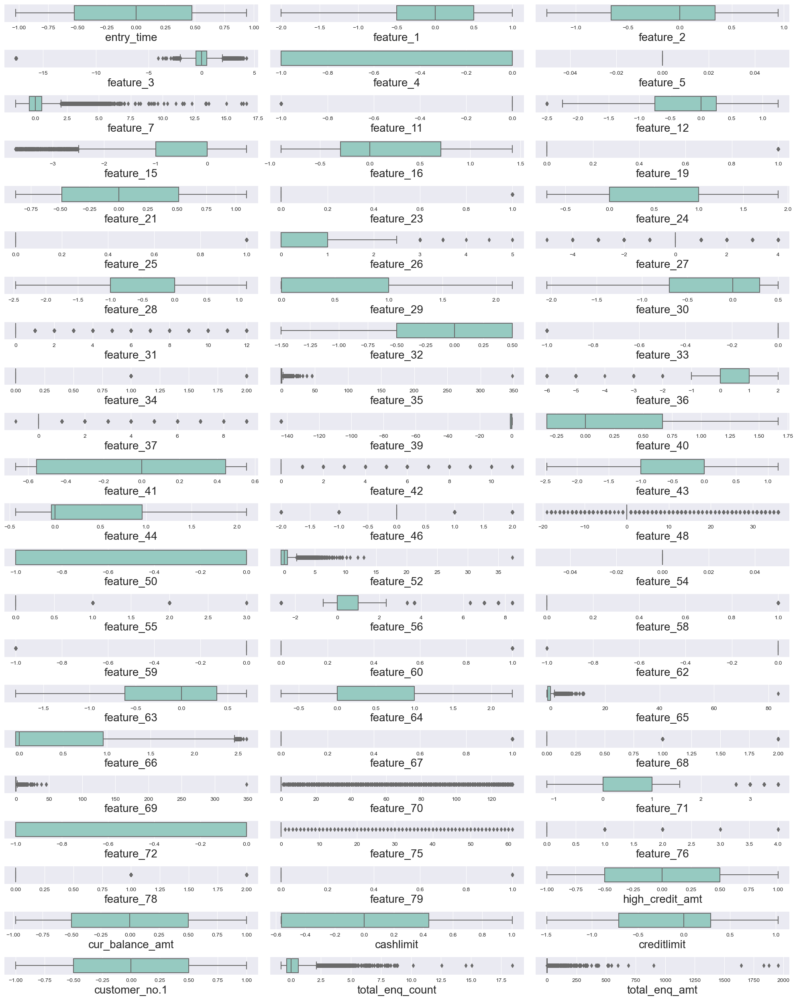

In [72]:
plt.figure(figsize=(20,25)) # defining canvas size
plotnum = 1 # counter

for column in data_2: # iteration of columns / acessing the columns from  dataset
    if plotnum<=70:    # a maximum of 70 box plots are generated to avoid overcrowding the visualization
        plt.subplot(22,3,plotnum) # # plotting  graphs (22-rows,3-columns) and plotnumber is for count
        sns.boxplot(x = data[column]) # Plotting box plots
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotnum+=1 # counter increment
plt.tight_layout() # the subplots are neatly arranged within the canvas.
plt.show() # displays the entire set of subplots as a visualization.

* The code effectively generates a grid of box plots, each showing the distribution of the scaled numerical features. This visualization allows you to observe the impact of scaling on the distribution of the features while considering the presence of outliers.

In [73]:
data.head()

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_47,feature_48,feature_50,feature_52,feature_54,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,customer_no.1,total_enq_count,total_enq_amt
0,0,18Apr15,1,-0.253333,-1.5,-0.420635,-1.731707,-0.5,0.0,5.910448,0.0,-1.75,-3.407407,-0.703540,0.0,ADFPNXXXXX,-0.663823,98332XXXXX,0.0,1.000000,0.0,1.0,0.0,-0.176471,1.037739,-2.00,0.0,0.5,0.0,1.0,1.395381,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-0.210526,0.993213,0.0,ADFPNXXXXX,31.0,0.0,-0.5,0.0,0.0,3.666667,1.0,0.0,0.0,0.0,-1.797695,1.000000,-1.203390,0.960534,0.0,1.0,1.395381,130.0,1.571429,0.0,0.0,0.0,98332XXXXX,0.0,0.0,0,-0.227034,0.040973,-0.024578,-0.472548,-1.000000,0.3125,1.015881
1,1,21Apr15,2,0.293333,-1.5,0.198413,0.951220,-1.0,0.0,16.358209,0.0,-1.75,-2.666667,-0.238938,0.0,AJWPRXXXXX,0.044411,99455XXXXX,0.0,0.000000,0.0,1.0,0.0,-1.941176,1.607238,-1.80,0.0,0.5,0.0,1.0,-0.697667,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-2.157895,1.564667,0.0,AJWPRXXXXX,31.0,-1.0,-0.5,0.0,0.0,2.333333,1.0,0.0,0.0,0.0,-1.736236,0.636364,-1.228814,1.510214,0.0,1.0,-0.697667,130.0,1.000000,0.0,0.0,0.0,99455XXXXX,0.0,0.0,0,-0.996556,0.758608,-0.562840,-1.489318,-0.999916,3.4375,1832.841015
2,2,22Apr15,3,0.293333,-1.5,0.198413,1.292683,-1.0,0.0,8.895522,0.0,-1.75,-2.666667,-0.238938,1.0,AFAPNXXXXX,-0.257114,98456XXXXX,0.0,1.138686,0.0,0.0,0.0,-1.941176,1.607238,-1.95,0.0,0.5,0.0,1.0,-0.697667,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-2.157895,1.564667,0.0,AFAPNXXXXX,0.0,-1.0,-0.5,0.0,2.0,2.333333,0.0,0.0,0.0,0.0,-1.782330,0.636364,-1.228814,1.510214,0.0,1.0,-0.697667,130.0,1.000000,0.0,0.0,0.0,98456XXXXX,0.0,0.0,0,-0.805519,-0.228853,-0.562462,0.000000,-0.999833,-0.7500,0.581750
3,3,25Apr15,4,-0.106667,-1.5,0.126984,1.195122,-1.0,0.0,5.910448,0.0,-1.75,-3.432099,-0.637168,0.0,AAAPDXXXXX,0.161748,98220XXXXX,0.0,1.467153,0.0,1.5,0.0,0.176471,1.074856,-0.85,0.0,0.5,0.0,1.0,1.627945,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,0.210526,1.032387,0.0,AAAPDXXXXX,31.0,0.0,-0.5,0.0,0.0,3.666667,1.0,0.0,0.0,0.0,-0.855314,1.000000,-1.194915,0.996359,0.0,1.0,1.627945,130.0,1.571429,0.0,50.0,1.0,98220XXXXX,0.0,0.0,0,0.340026,-0.826211,0.193222,-0.178727,-0.999749,1.3125,13.598945
4,4,06May15,5,0.853333,-1.5,0.111111,0.000000,0.0,0.0,5.910448,0.0,-1.75,-3.691358,-0.075221,0.0,ABEPSXXXXX,-0.704260,98111XXXXX,0.0,1.000000,0.0,1.5,0.0,-1.117647,0.042561,-0.50,0.0,0.5,0.0,1.0,6.279216,0.0,0.0,-143.571429,-0.333333,-0.666667,0.0,-1.000000,0.000029,0.0,ABEPSXXXXX,31.0,-1.0,-0.5,0.0,0.0,1.000000,1.0,0.0,0.0,0.0,-0.491677,0.272727,-1.305085,-0.000010,0.0,1.0,6.279216,130.0,0.428571,0.0,0.0,0.0,98111XXXXX,0.0,0.0,0,-0.658336,0.855735,-0.562462,0.000000,-0.999665,-0.6875,-0.351227


# 8.Feature Engineering

DROP UNIQUE AND CONSTANT FEATURES :-
    
    * In this dataset unique column available('feature_5','feature_20','feature_22','feature_ 47','feature_54','feature_77') so       drop this column
    * Remove unwanted columns like ids,date,time.

In [74]:
data.drop(['Unnamed: 0','dt_opened','entry_time','feature_5','feature_20','feature_22','feature_47','feature_54','feature_77','customer_no.1',],axis=1,inplace=True)

In [75]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 64 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   customer_no      23896 non-null  int64  
 1   feature_1        23896 non-null  float64
 2   feature_2        23896 non-null  float64
 3   feature_3        23896 non-null  float64
 4   feature_4        23896 non-null  float64
 5   feature_7        23896 non-null  float64
 6   feature_11       23896 non-null  float64
 7   feature_12       23896 non-null  float64
 8   feature_15       23896 non-null  float64
 9   feature_16       23896 non-null  float64
 10  feature_19       23896 non-null  float64
 11  feature_21       23896 non-null  float64
 12  feature_23       23896 non-null  float64
 13  feature_24       23896 non-null  float64
 14  feature_25       23896 non-null  float64
 15  feature_26       23896 non-null  float64
 16  feature_27       23896 non-null  float64
 17  feature_28  

In [76]:
# First convert the data-type of all feature because all feature data-type is object

data = data.astype('int64')

* The purpose of converting columns to the int64 data type is to ensure that all values in these columns are treated as integers. This can be useful when we perform integer-based operations or if we want to ensure consistency in the data types across all columns.

In [77]:
# Get data type of all feature

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 64 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   customer_no      23896 non-null  int64
 1   feature_1        23896 non-null  int64
 2   feature_2        23896 non-null  int64
 3   feature_3        23896 non-null  int64
 4   feature_4        23896 non-null  int64
 5   feature_7        23896 non-null  int64
 6   feature_11       23896 non-null  int64
 7   feature_12       23896 non-null  int64
 8   feature_15       23896 non-null  int64
 9   feature_16       23896 non-null  int64
 10  feature_19       23896 non-null  int64
 11  feature_21       23896 non-null  int64
 12  feature_23       23896 non-null  int64
 13  feature_24       23896 non-null  int64
 14  feature_25       23896 non-null  int64
 15  feature_26       23896 non-null  int64
 16  feature_27       23896 non-null  int64
 17  feature_28       23896 non-null  int64
 18  featur

**Checking Correlation**

##### Heatmap :-
    
* The heatmap is a powerful visualization tool for quickly identifying relationships between features in a dataset. It helps in understanding which features are strongly correlated, which can be important for feature selection, dimensionality reduction, and building predictive models.

In [78]:
data.corr()

,customer_no,feature_1,feature_2,feature_3,feature_4,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_21,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_48,feature_50,feature_52,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_75,feature_76,feature_78,feature_79,Bad_label,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,total_enq_count,total_enq_amt
customer_no,1.000000,-0.687950,-0.030750,0.025652,-0.175635,-0.047912,-0.032704,-0.691496,0.172494,-0.138198,-0.003687,0.006364,-0.096792,-0.055469,0.035894,-0.262112,0.018561,0.080327,-0.253892,0.007046,0.199726,0.023333,-0.043709,-0.008931,-0.017408,0.028949,0.149054,0.009169,0.018312,NaN,0.018286,-0.005007,-0.243148,0.006816,-0.023919,-0.107861,-0.037238,-0.007239,0.026292,-0.054949,-0.032704,-0.031695,-0.001077,0.004643,0.015241,0.056863,-0.137888,0.043709,-0.008931,-0.017408,-0.006656,0.057736,-0.028477,-0.002387,-0.003088,-0.009862,-0.008111,-0.001673,-0.002361,0.008230,0.010325,0.012241,-0.060557,-0.034666
feature_1,-0.687950,1.000000,0.013400,-0.016073,0.101195,-0.061750,0.035019,0.976392,-0.061104,0.110598,0.011730,-0.005049,0.043104,0.025059,-0.002103,0.136285,-0.001454,-0.054785,0.145646,0.017903,-0.065861,-0.009404,0.017389,-0.079464,-0.017105,-0.021310,-0.052245,0.079884,0.016528,NaN,0.004346,-0.003012,0.154418,-0.012392,-0.026377,0.057292,-0.004067,0.007733,-0.047830,-0.048343,0.035019,-0.040985,0.001372,0.013201,-0.029001,-0.024038,0.101626,-0.017389,-0.079464,-0.017105,-0.079822,-0.055879,0.019997,-0.016226,-0.022597,0.060555,-0.007860,-0.025382,0.001292,-0.001941,-0.002010,-0.002103,-0.012977,-0.055980
feature_2,-0.030750,0.013400,1.000000,0.003436,0.041077,0.004814,0.005011,0.013861,-0.009270,0.019768,-0.000410,0.013992,-0.004053,0.001759,0.000675,0.012796,0.006490,-0.005906,0.022110,0.004120,-0.047665,-0.004301,-0.009715,-0.011225,0.002801,0.006327,-0.005020,0.010470,-0.008568,NaN,0.005670,0.011278,0.017903,0.010858,0.017712,-0.003333,0.001851,-0.000582,-0.000241,0.015964,0.005011,0.010302,0.003976,0.001452,0.011611,0.007608,0.010734,0.009715,-0.011225,0.002801,-0.012522,-0.002466,0.012021,-0.011190,-0.011931,0.019190,0.005163,-0.003662,0.011078,0.000840,-0.004001,0.000687,0.008573,0.001277
feature_3,0.025652,-0.016073,0.003436,1.000000,-0.169464,0.120866,0.001046,-0.018949,0.007058,-0.038518,0.026269,0.015127,0.036891,0.020768,-0.073401,0.025028,0.008032,0.013610,-0.020931,-0.044549,-0.000420,-0.004857,0.047295,0.074929,0.047275,-0.014152,-0.019971,-0.073775,-0.028425,NaN,-0.026674,0.017119,-0.045406,-0.001458,0.020992,-0.044692,0.064932,0.026493,0.031637,0.021780,0.001046,0.003274,-0.003485,-0.040000,0.005090,-0.021343,-0.058106,-0.047295,0.074929,0.047275,0.077757,0.016680,0.039859,0.030233,-0.018287,-0.005334,-0.006157,-0.034280,0.006129,-0.005298,-0.005078,-0.011751,-0.025127,0.033160
feature_4,-0.175635,0.101195,0.041077,-0.169464,1.000000,-0.044950,-0.010041,0.118452,0.141353,-0.133706,-0.023271,-0.010188,0.067128,0.049826,0.040779,0.162904,0.094624,0.060293,-0.140835,0.043111,-0.224461,-0.028924,-0.109686,-0.119760,-0.013613,-0.054670,-0.063118,0.120331,-0.010479,NaN,0.026968,-0.083140,-0.085898,-0.001090,-0.004899,0.019285,-0.008763,-0.025615,0.028402,-0.065488,-0.010041,-0.055577,-0.002849,0.041460,0.025897,0.083472,-0.004594,0.109686,-0.119760,-0.013613,-0.113758,0.053217,-0.051174,-0.018460,-0.013566,0.029813,0.002849,0.022289,-0.015912,-0.014020,-0.004923,0.001779,0.034738,-0.011912
feature_7,-0.047912,-0.061750,0.004814,0.120866,-0.044950,1.000000,0.009910,-0.058176,-0.056586,0.011479,-0.017495,0.010781,-0.041407,0.040053,-0.083649,0.067614,0.012870,-0.041609,0.045973,-0.050364,-0.027243,0.

* Each cell in the correlation matrix represents the correlation coefficient between two columns in the DataFrame. A high positive correlation (close to 1) suggests a strong positive linear relationship, while a high negative correlation (close to -1) suggests a strong negative linear relationship. A correlation close to 0 indicates little to no linear relationship.

* The correlation matrix is useful for understanding how different features in the dataset are related to each other. It's often used in data analysis to identify patterns, multicollinearity (where two or more variables are highly correlated), and to make informed decisions about feature selection or model building in machine learning.

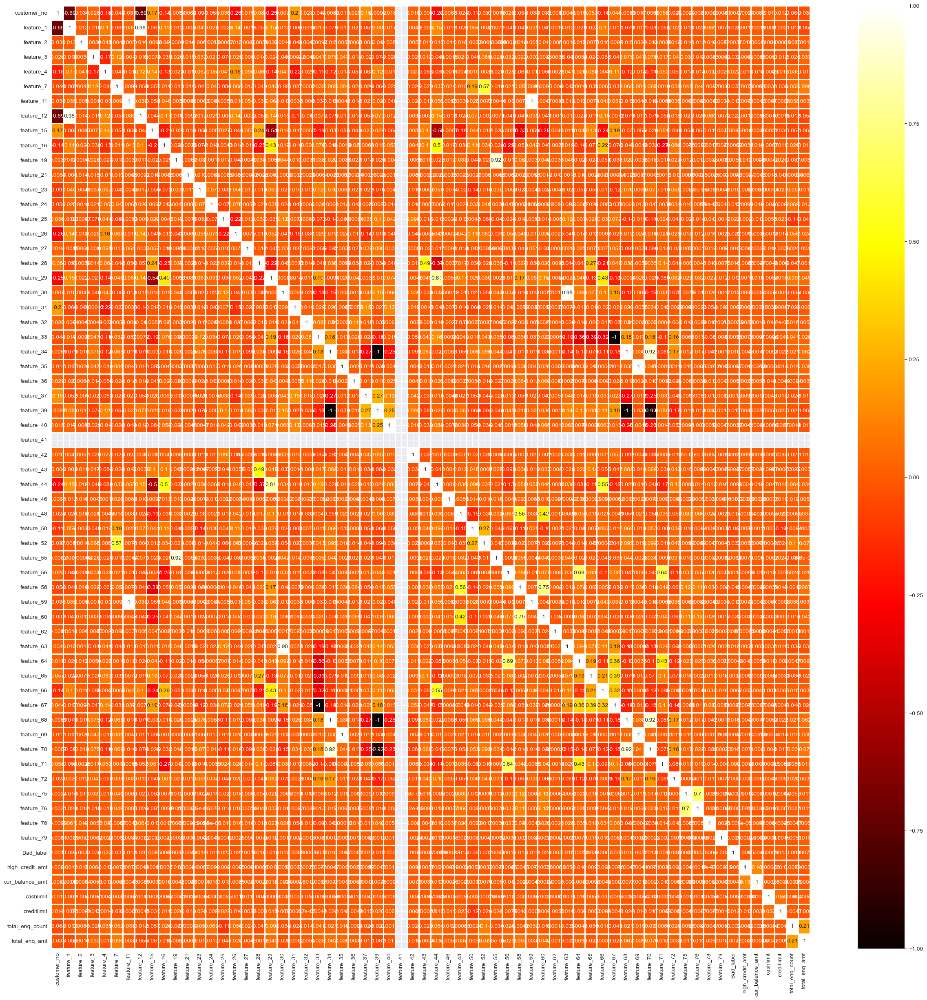

In [79]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),annot=True,cmap='hot',linewidths=2)
plt.show()

* From above heatmap scale we are clearly see that this is very difficult to find highly correalted feature in data.

* So we confirm with the help of simple python code to check the highly correlated features

* annot=True: It specifies that the values of the correlation coefficients should be annotated (displayed) within each cell of the heatmap.

* cmap='hot': This sets the color map for the heatmap. The 'hot' color map ranges from red (negative correlations) to yellow (no correlation) to green (positive correlations), helping to visually represent the strength and direction of correlations.

In [80]:
 #To get highly corelated features
    
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr
0,feature_39,feature_68,0.995830
1,feature_68,feature_39,0.995830
2,feature_34,feature_39,0.995830
3,feature_39,feature_34,0.995830
4,feature_12,feature_1,0.976392
5,feature_1,feature_12,0.976392
6,feature_63,feature_30,0.975522
7,feature_30,feature_63,0.975522
8,feature_39,feature_70,0.923731
9,feature_70,feature_39,0.923731


#### Here we are going to drop highly correlated features.

* pd.set_option('display.max_rows', None): This line sets the display option to show all rows in the output, ensuring that all highly correlated pairs are visible.

* corrmat = data.corr(): This code calculates the correlation matrix for all columns in the DataFrame data.

* corrmat = corrmat.abs().unstack(): This line takes the absolute values of the correlation matrix and unstacks it. Unstacking transforms the correlation matrix into a series with pairs of features as indices.

* corrmat = corrmat.sort_values(ascending=False): The code sorts the correlation values in descending order, which means that highly correlated pairs will appear at the top of the series.

* corrmat = corrmat[corrmat >= 0.9]: This line filters the correlation values to only keep those that are greater than or equal to 0.9. In other words, it selects highly correlated pairs with a correlation coefficient of at least 0.9.

* corrmat = corrmat[corrmat < 1]: Here, it further filters the correlation values to exclude pairs with a correlation coefficient of 1. A correlation of 1 indicates a perfect linear relationship, and we want to exclude such cases.

* corrmat = pd.DataFrame(corrmat).reset_index(): This code converts the filtered correlation series back into a DataFrame and resets the index, so the pairs of features become columns.

* corrmat.columns = ['feature1', 'feature2', 'corr']: It assigns meaningful column names to the DataFrame, with 'feature1' and 'feature2' representing the names of the correlated features and 'corr' representing the correlation coefficient between them.

* corrmat: Finally, the DataFrame corrmat is displayed, showing highly correlated pairs of features along with their correlation coefficients.

* This analysis is useful for identifying and potentially addressing multicollinearity issues when working with machine learning models, as highly correlated features can impact the model's performance.

In [81]:
data.drop(['feature_63','feature_39','feature_44','feature_1','feature_70','feature_55'],axis=1,inplace=True)

* This line of code is used to drop (remove) columns from the DataFrame 'data'.

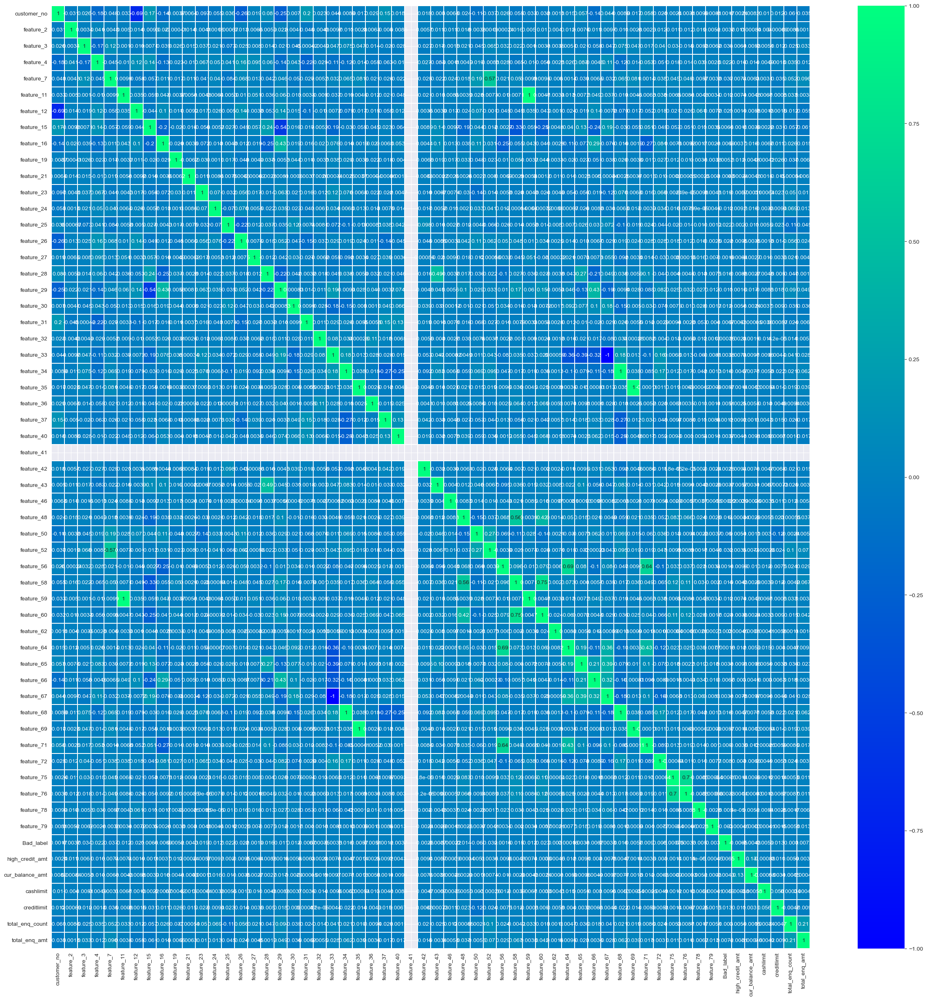

In [82]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),annot=True,cmap='winter',linewidths=.1)
plt.show()

* From above heatmap scale we are clearly see that their is no highly correlated feature in data

* But we confirm with the help of a simple code below

In [83]:
 #To get highly corelated feature
    
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


* Now we can confirm that there is no highly correlated features present.

# 9.Split Data into x and y

In [84]:
data_final = data.loc[:,['customer_no', 'feature_2', 'feature_3', 'feature_4', 'feature_7',
       'feature_11', 'feature_12', 'feature_15', 'feature_16', 'feature_19',
       'feature_21','feature_23', 'feature_24', 'feature_25',
       'feature_26', 'feature_27', 'feature_28', 'feature_29', 'feature_30',
       'feature_31', 'feature_32', 'feature_33', 'feature_34', 'feature_35',
       'feature_36', 'feature_37', 'feature_40', 'feature_41', 'feature_42',
       'feature_43', 'feature_46', 'feature_48', 'feature_50', 'feature_52',
       'feature_56', 'feature_58', 'feature_59', 'feature_60', 'feature_62',
       'feature_64', 'feature_65', 'feature_66', 'feature_67', 'feature_68',
       'feature_69', 'feature_71', 'feature_72', 'feature_75', 'feature_76',
       'feature_78', 'feature_79', 'high_credit_amt',
       'cur_balance_amt', 'cashlimit', 'creditlimit', 'total_enq_count',
       'total_enq_amt','Bad_label']]

* The provided code is used to create a new DataFrame named data_final by selecting specific columns from the original DataFrame 'data'The purpose of creating data_final is likely for further analysis or modeling, where these selected columns are relevant for the analysis or prediction task

In [85]:
data_final.head()

,customer_no,feature_2,feature_3,feature_4,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_21,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_40,feature_41,feature_42,feature_43,feature_46,feature_48,feature_50,feature_52,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_71,feature_72,feature_75,feature_76,feature_78,feature_79,high_credit_amt,cur_balance_amt,cashlimit,creditlimit,total_enq_count,total_enq_amt,Bad_label
0,1,0,-1,0,5,0,-1,-3,0,0,0,0,1,0,1,0,0,1,-2,0,0,0,1,1,0,0,0,0,0,0,0,31,0,0,3,1,0,0,0,1,-1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0
1,2,0,0,-1,16,0,-1,-2,0,0,0,0,0,0,1,0,-1,1,-1,0,0,0,1,0,0,0,0,0,0,-2,0,31,-1,0,2,1,0,0,0,0,-1,1,0,1,0,1,0,0,0,0,0,0,0,0,-1,3,1832,0
2,3,0,1,-1,8,0,-1,-2,0,1,0,0,1,0,0,0,-1,1,-1,0,0,0,1,0,0,0,0,0,0,-2,0,0,-1,0,2,0,0,0,0,0,-1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,4,0,1,-1,5,0,-1,-3,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,31,0,0,3,1,0,0,0,1,-1,0,0,1,1,1,0,50,1,0,0,0,0,0,0,1,13,0
4,5,0,0,0,5,0,-1,-3,0,0,0,0,1,0,1,0,-1,0,0,0,0,0,1,6,0,0,0,0,0,-1,0,31,-1,0,1,1,0,0,0,0,-1,0,0,1,6,0,0,0,0,0,0,0,0,0,0,0,0,0


In [86]:
X = data_final.iloc[:,:-1]
y = data_final.Bad_label

* X = data_final.iloc[:, :-1]: This line creates a DataFrame X by selecting all rows and all columns of data_final except for the last column. In machine learning, X typically represents the input features or independent variables used to make predictions.

* y = data_final.Bad_label: This line creates a Series y by selecting the column named 'Bad_label' from the data_final DataFrame. In machine learning, y typically represents the target variable or dependent variable that we want to predict. In this case, it seems to represent a binary label, such as "bad" or "good" credit status.

* So, after running this code, we have:

* X: A DataFrame containing all the input features.

* y: A Series containing the target labels.

* These can be used to train machine learning models where we use the features in X to predict the labels in y.



In [87]:
y.value_counts()

Bad_label
0    22892
1     1004
Name: count, dtype: int64

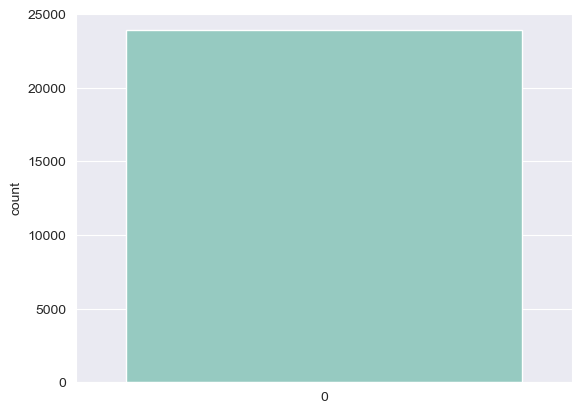

In [88]:
#Plotting the graph

sns.countplot(y)
plt.show()

***Balancing The Target Column Using SMOTE***

In [89]:
# It is used to calculate the percentage distribution of unique values in the Series 'y'

y.value_counts(normalize=True)*100

Bad_label
0    95.79846
1     4.20154
Name: proportion, dtype: float64

In [90]:
#!pip install -U imbalanced-learn

* "imbalanced-learn" is a library commonly used for dealing with imbalanced datasets in machine learning, where one class of data significantly outnumbers the other(s). This library provides tools and techniques to address this issue and improve model performance.

* -U or --upgrade: This option tells pip to upgrade the specified package to the latest version if it's already installed. If the package is not installed, it will be installed as usual.

In [91]:
# SMOTE(synthetic minority oversampling techinque)
    
sm = SMOTE() # object creation
print("unbalanced data   :  ",Counter(y))
X_sm,y_sm = sm.fit_resample(X,y)
print("balanced data:    :",Counter(y_sm))

unbalanced data   :   Counter({0: 22892, 1: 1004})
balanced data:    : Counter({0: 22892, 1: 22892})


* from collections import Counter: This line imports the Counter class from the Python collections module. Counter is used to count the occurrences of elements in a list or iterable.

* from imblearn.over_sampling import SMOTE: This line imports the SMOTE (Synthetic Minority Over-sampling Technique) class from the "imbalanced-learn" library. SMOTE is a technique used to oversample the minority class in an imbalanced dataset by generating synthetic samples.

* sm = SMOTE(): This line creates an instance of the SMOTE class, which will be used to perform the oversampling.

* print("unbalanced data : ", Counter(y)): This line prints the count of each unique value in the y Series, which represents the original unbalanced data. It's useful to see how many instances are in each class before oversampling.

* X_sm, y_sm = sm.fit_resample(X, y): This line applies the SMOTE technique to the input features X and target labels y. It oversamples the minority class to balance the dataset. The oversampled data is stored in X_sm (features) and y_sm (labels).

* print("balanced data: :", Counter(y_sm)): This line prints the count of each unique value in the y_sm Series, which represents the balanced (oversampled) data. It's useful to confirm that the dataset is now balanced after applying SMOTE.

* In summary, this code uses SMOTE to address class imbalance in a dataset by generating synthetic samples for the minority class, thus balancing the dataset. The Counter class is used to count the occurrences of class labels before and after oversampling for evaluation purposes.

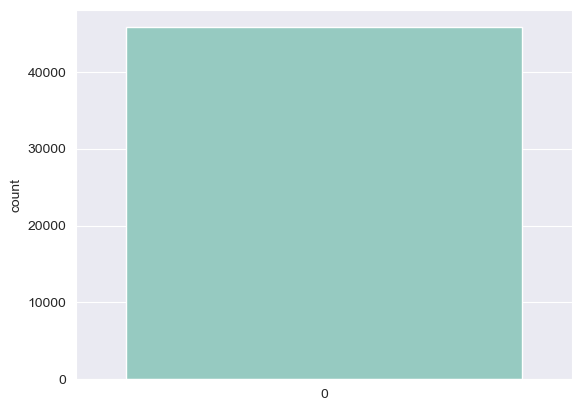

In [92]:
#Plotting the graph

sns.countplot(y_sm)
plt.show()

# 10.Split data for trainning and testing

In [93]:
# preparing training and testing data

X_train,X_test,y_train,y_test = train_test_split(X_sm,y_sm,random_state=10,test_size=.2)

* X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, random_state=10, test_size=0.2): This line splits the data into training and testing sets.

* X_sm: This is the input feature dataset that has been oversampled using SMOTE.

* y_sm: This is the target label dataset that corresponds to the oversampled data.

* random_state=10: This parameter is set to ensure reproducibility. It means that the random splitting process will be the same every time you run the code with this seed value.

* test_size=0.2: This parameter specifies the size of the testing set as a fraction of the total dataset. In this case, it's set to 0.2, which means 20% of the data will be used for testing, and the remaining 80% will be used for training.

* X_train: This variable will contain the training set of input features.

* X_test: This variable will contain the testing set of input features.

* y_train: This variable will contain the training set of target labels.

* y_test: This variable will contain the testing set of target labels.

* In summary, this code splits the oversampled dataset (X_sm and y_sm) into a training set (X_train and y_train) and a testing set (X_test and y_test) with a specified random seed and a specified test size ratio. This is a common step in machine learning to evaluate the performance of models on unseen data.

In [94]:
# Check shape of train and test

X_train.shape

(36627, 57)

***It means there are 36627 samples (rows) in the training set, and each sample has 57 features (columns)
X_test.shape.***

In [95]:
X_test.shape

(9157, 57)

***It means there are 9157 samples (rows) in the testing set, and each sample has 57 features (columns).***

In [96]:
y_train.shape

(36627,)

***It means there are 36627 target labels in the training set.***

In [97]:
y_test.shape

(9157,)

***It means there are 9157 target labels in the testing set.***

# 11.Model Building and Evaluation

***i).Logistic Regression:-***

In [98]:

# Object creation
log_model = LogisticRegression()

# Fitting the training data
log_model.fit(X_train,y_train)

# Prediction on test data
log_test_predict = log_model.predict(X_test)

# Prediction on training data
log_train_predict = log_model.predict(X_train)

* log_model.fit(X_train, y_train): This line trains the logistic regression model using the training data

* log_test_predict = log_model.predict(X_test): This line uses the trained logistic regression model to make predictions on the   testing set (X_test) of input features. The predicted labels are stored in the log_test_predict variable.

* log_train_predict = log_model.predict(X_train): This line uses the same trained logistic regression model to make predictions   on the training set (X_train) of input features. The predicted labels are stored in the log_train_predict variable.

* In summary, this code sets up a logistic regression classifier, trains it on the training data, and then uses it to make         predictions on both the training and testing data. This is a common workflow in supervised machine learning for classification   tasks.

***Evaluation:-***

*Training Data Accuracy*

In [99]:
log_train_accuracy = accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 78.2182542932809
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.82      0.76      0.79     19492
           1       0.75      0.80      0.78     17135

    accuracy                           0.78     36627
   macro avg       0.78      0.78      0.78     36627
weighted avg       0.78      0.78      0.78     36627



*Testing Data Accuracy*

In [100]:
log_test_accuracy = accuracy_score(log_test_predict,y_test)
print("Testing accuracy of Logistic regession model",log_test_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(log_test_predict,y_test))

Testing accuracy of Logistic regession model 78.07142077099488
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.81      0.77      0.79      4898
           1       0.75      0.80      0.77      4259

    accuracy                           0.78      9157
   macro avg       0.78      0.78      0.78      9157
weighted avg       0.78      0.78      0.78      9157



* Logisticregression classifier model works well on training and testing side.

***USE BAGGING ON LOGISTIC REGRESSION MODEL:-***

In [101]:
# Create logistic regression object
log_reg1 = LogisticRegression()

bagg = BaggingClassifier(base_estimator=log_reg1,n_estimators=45)
#base_estimator---> algorithm which you want to pass
#n_estimotors-----> number of base learners

# Fitting the training data
bagg.fit(X_train,y_train)

# Prediction on test data
bagg_predict = bagg.predict(X_test)

* The code we have provided will create a bagging classifier model using logistic regression as the base estimator. The number of base learners is set to 45. The model will be fitted on the training data and the predictions will be made on the test data.

* The output of the code will be the predictions of the bagging classifier model on the test data. You can use these predictions to evaluate the performance of the model.

In [102]:
bagg_recall = accuracy_score(bagg_predict,y_test)
print("Racall score after bagging",bagg_recall)

Racall score after bagging 0.7835535655782462


* After applying bagging score slightly improves.

***********************************************************

***ii).K-Nearest Neighbours Classifier (KNN):-***

In [103]:
# Taking the optimal value of k

error_rate = [] # Creating empty list
for i in range(2,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    y_knn_predict = knn.predict(X_test)
    error_rate.append(np.mean(y_knn_predict != y_test))
print("Error rate:",error_rate)

Error rate: [0.1834662007207601, 0.23632193949983618, 0.22125150158348805, 0.25838156601507045, 0.24898984383531725, 0.2753085071529977, 0.2611117178115103, 0.28098722288959266, 0.2711586764224091]


* The code we have provided will calculate the error rate of the KNeighborsClassifier model for different values of k. The error rate is the percentage of test data points that are misclassified by the model.

* The lowest error rate is 0.17, which occurs when k=2. This means that the KNeighborsClassifier model with k=2 misclassifies only 17% of the test data points.

* The optimal value of k will depend on the specific dataset. It is a good idea to experiment with different values of k to find the one that gives the best results on the test data.

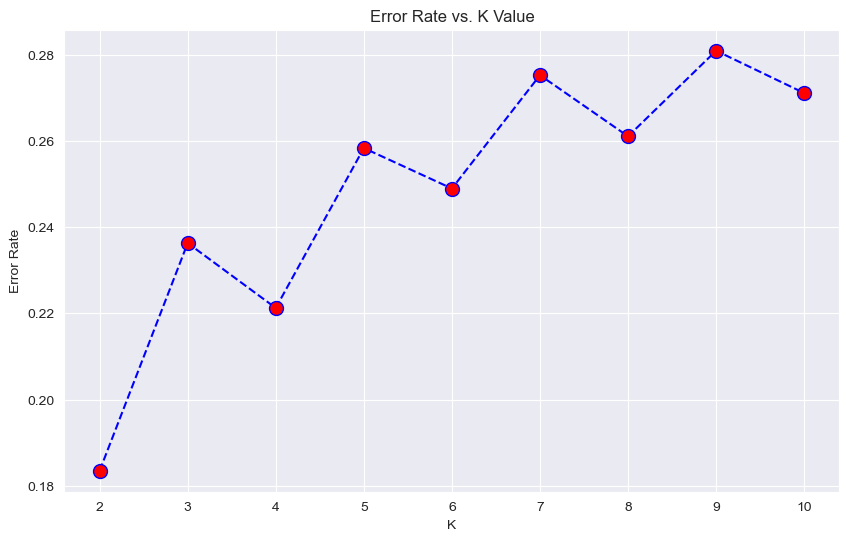

In [104]:
# Plotting the error rate

plt.figure(figsize=(10,6))
plt.plot(range(2,11),error_rate,color='blue', linestyle='dashed',marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [105]:
# Get nearst neighbors
knn1 = KNeighborsClassifier(n_neighbors=4)

# Fitting the training data
knn1.fit(X_train,y_train)

# Prediction on testing data
knn_test_predict = knn1.predict(X_test)

# Prediction on training data
knn_train_predict = knn1.predict(X_train)

***Evaluation:-***

*Training Data Accuracy*

In [106]:
knn_train_accuracy = accuracy_score(y_train,knn_train_predict)
print("Training accuracy of knn model ",knn_train_accuracy*100)
print("Training classification report:\n",classification_report(knn_train_predict,y_train))

Training accuracy of knn model  87.52832609823355
Training classification report:
               precision    recall  f1-score   support

           0       0.83      0.92      0.87     16488
           1       0.92      0.84      0.88     20139

    accuracy                           0.88     36627
   macro avg       0.88      0.88      0.87     36627
weighted avg       0.88      0.88      0.88     36627



* KNN classifier model slightly performs well accuracy on training data.

*Testing Data Accuracy*

In [107]:
knn_test_accuracy = accuracy_score(y_test,knn_test_predict)
print("Testing accuracy of knn model",knn_test_accuracy*100)
print("Testing classification report: \n",classification_report(y_test,knn_test_predict))

Testing accuracy of knn model 77.8748498416512
Testing classification report: 
               precision    recall  f1-score   support

           0       0.84      0.69      0.76      4618
           1       0.73      0.87      0.80      4539

    accuracy                           0.78      9157
   macro avg       0.79      0.78      0.78      9157
weighted avg       0.79      0.78      0.78      9157



* But testing accuracy is still lagging so we apply bagging

***USE BAGGING ON K-NEIGHBOURS CLASSIFIER:-***

In [108]:
# Create a K-neighbour classifier object
knn1 = KNeighborsClassifier(n_neighbors=3)

# importing library and creating bagging object
from sklearn.ensemble import BaggingClassifier
bagg = BaggingClassifier(base_estimator=knn1,n_estimators=50)
#base_estimator---> algorithm which you want to pass
#n_estimotors-----> number of base learners

# Fitting the training data
bagg.fit(X_train,y_train)

# Prediction on test data
bagg_predict = bagg.predict(X_test)

***Evaluation:-***

In [109]:
bagg_accuracy = accuracy_score(y_test,bagg_predict)
print("Score after bagging:",bagg_accuracy*100)

Score after bagging: 76.793709730261


* Score does not improve after bagging .

*********************

***iii).Decision Tree:-***

In [110]:
# Importing library and object creation

dtc = DecisionTreeClassifier()

# fitting training data
dtc.fit(X_train,y_train)

# Prediction on test data
dtc_test_predict = dtc.predict(X_test)

# Prediction on training data
dtc_train_predict = dtc.predict(X_train)

***Evaluation:-***

*Training Data Accuracy*

In [111]:
dtc_train_accuracy = accuracy_score(y_train,dtc_train_predict)
print("Training accuracy of Decision tree classifier:",dtc_train_accuracy*100)
print("classification report of training:"'\n',classification_report(y_train,dtc_train_predict))

Training accuracy of Decision tree classifier: 99.99180932099272
classification report of training:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     18274
           1       1.00      1.00      1.00     18353

    accuracy                           1.00     36627
   macro avg       1.00      1.00      1.00     36627
weighted avg       1.00      1.00      1.00     36627



*Testing Data Accuracy*

In [112]:
dtc_test_accuracy = accuracy_score(y_test,dtc_test_predict)
print("Training accuracy of Decision tree classifier:",dtc_test_accuracy*100)
print("classification report of training:"'\n',classification_report(y_test,dtc_test_predict))

Training accuracy of Decision tree classifier: 92.8470022933275
classification report of training:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      4618
           1       0.91      0.95      0.93      4539

    accuracy                           0.93      9157
   macro avg       0.93      0.93      0.93      9157
weighted avg       0.93      0.93      0.93      9157



**************

***iv).Random Forest Classifier:-***

In [113]:
# import library and object creation
rf = RandomForestClassifier()

# fitting the training data
rf.fit(X_train,y_train)

# Prediction on test data
rf_test_predict = rf.predict(X_test)

# Prediction on training data
rf_train_predict = rf.predict(X_train)

***Evaluation:-***

*Training Data Accuracy*

In [114]:
rf_train_accuracy = accuracy_score(y_train,rf_train_predict)
print("Training accuracy of random forest classifier:",rf_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_train,rf_train_predict))

Training accuracy of random forest classifier: 99.98907909465696
Classification report of training:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     18274
           1       1.00      1.00      1.00     18353

    accuracy                           1.00     36627
   macro avg       1.00      1.00      1.00     36627
weighted avg       1.00      1.00      1.00     36627



*Testing Data Accuracy*

In [115]:
rf_test_accuracy = accuracy_score(y_test,rf_test_predict)
print("Testing accuracy of random forest classifier:",rf_test_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_test,rf_test_predict))

Testing accuracy of random forest classifier: 96.54908812929999
Classification report of training:
               precision    recall  f1-score   support

           0       0.96      0.98      0.97      4618
           1       0.98      0.95      0.96      4539

    accuracy                           0.97      9157
   macro avg       0.97      0.97      0.97      9157
weighted avg       0.97      0.97      0.97      9157



*************

***v).Gradient Boosting Classifier:-***

In [116]:
# Object cretion
gbm=GradientBoostingClassifier(learning_rate=0.1,n_estimators=150,random_state=42)

# fitting the training data
gbm.fit(X_train,y_train) ## fitting the data

# prediction on test data
gbm_test_predict=gbm.predict(X_test)

# Prediction on train data
gbm_train_predict = gbm.predict(X_train)

***Evaluation:-***

*Training Data Accuracy*

In [117]:
gbm_train_accuracy = accuracy_score(y_train,gbm_train_predict)
print("Grediant boosting classifier training accuracy:",gbm_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(y_train,gbm_train_predict))

Grediant boosting classifier training accuracy: 92.39085920222786
Classification report of training:
               precision    recall  f1-score   support

           0       0.93      0.92      0.92     18274
           1       0.92      0.93      0.92     18353

    accuracy                           0.92     36627
   macro avg       0.92      0.92      0.92     36627
weighted avg       0.92      0.92      0.92     36627



*Testing Data Accuracy*

In [118]:
gbm_test_accuracy = accuracy_score(y_test,gbm_test_predict)
print("Grediant boosting classifier testing accuracy:",gbm_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(y_test,gbm_test_predict))

Grediant boosting classifier testing accuracy: 92.35557496996833
Classification report of testing:
               precision    recall  f1-score   support

           0       0.93      0.92      0.92      4618
           1       0.92      0.93      0.92      4539

    accuracy                           0.92      9157
   macro avg       0.92      0.92      0.92      9157
weighted avg       0.92      0.92      0.92      9157



* Gradient boosting classifier works well on training and testing side.


***vi).XGB Classifier:-***

In [119]:
# import library and object creation
import xgboost

xgb = XGBClassifier()

# Fitting the training data
xgb.fit(X_train,y_train)

# Prediction on training data
xgb_train_predict = xgb.predict(X_train)

# Prediction on testing data
xgb_test_predict = xgb.predict(X_test)

***Evaluation:-***

*Training Data Accuracy*

In [120]:
xgb_train_accuracy = accuracy_score(xgb_train_predict,y_train)
print("Training accuracy of xgb model",xgb_train_accuracy*100)
print("Classifiaction report on training: \n",classification_report(xgb_train_predict,y_train))

Training accuracy of xgb model 96.21863652496792
Classifiaction report on training: 
               precision    recall  f1-score   support

           0       0.97      0.96      0.96     18489
           1       0.96      0.97      0.96     18138

    accuracy                           0.96     36627
   macro avg       0.96      0.96      0.96     36627
weighted avg       0.96      0.96      0.96     36627



*Testing Data Accuracy*

In [121]:
xgb_test_accuracy = accuracy_score(xgb_test_predict,y_test)
print("Testing accuracy of xgb model",xgb_test_accuracy*100)
print("Classification report on testing: \n",classification_report(xgb_test_predict,y_test))

Testing accuracy of xgb model 95.39150376760948
Classification report on testing: 
               precision    recall  f1-score   support

           0       0.96      0.95      0.95      4646
           1       0.95      0.96      0.95      4511

    accuracy                           0.95      9157
   macro avg       0.95      0.95      0.95      9157
weighted avg       0.95      0.95      0.95      9157



* XGB Classifier works well on training and testing side.

*********************

********************

# OBSERVATION:-

* Logisticregression classifier model works well on training data as well as testing data And The score of training and testing data is 74.25% and 73.13%. But Testing accuracy is still lagging so we applied bagging. After applying bagging score slightly improves (After bagging score = 76.47%).

* KNeighboursClassifier model slightly performs well in accuracy on training data as well as testing data. The score of training and testing data respectively is 87.55% & 77.73% .Testing accuracy is still lagging so we applied bagging but score does not improve after bagging (After bagging score = 76.58%.)

* Decision Tree Classifier model works very well on training data and The score of training data is 99.99% .Testing data is also good and testing score is 92.7%.

* Random Forest Classifier model also works very well on training data and The score of training data is 99.99% .Testing data is also good and testing score is 96.56%.

* Gradient Boosting Classifier model works well on training and testing data. It's training score is 92.44% and testing score is 92.31%.

* XGB Classifier model performs well in accuracy on training data as well as testing data. The score of training and testing data is 96.45% & 95.71% respectively.

*********

# CONCLUSION :-

* From above models we select ***XGB classifier*** as the best model because this model performs well on training as well as testing side and has low variance and low bias .

*******************

# CHALLENGES FACED :-

* In this project detail information about columns is not provided maximum name of the column is only fetures, hence it very difficult to predict and uderstand the columns on it's name and face difficulties to get insight from columns.

* And little bit callenged is faced to fetch data from server and convert it proper working format by removing unwanted data from it.